# Data Analysis 3 - Home Assignment 3

**Author: Márton Nagy**

In [1]:
import pandas as pd
import numpy as np
import pickle
import warnings
warnings.filterwarnings('ignore')
from datetime import datetime
import itertools
from joblib import Parallel, delayed
from tqdm import tqdm
import logging

from plotnine import *
from IPython.display import display
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

color = ["#DB5461", "#080357", "#3B8EA5", "#3B8EA5", "#3B8EA5"]

import patsy
from sklearn.metrics import mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from prophet import Prophet
from prophet.diagnostics import cross_validation
from prophet.diagnostics import performance_metrics
import holidays
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import grangercausalitytests
from xgboost import XGBRegressor
from statsmodels.tsa.api import VAR

Reading raw datafile.

In [2]:
data = pd.read_csv('data.csv')

Converting to datetime.

In [3]:
data['ts'] = pd.to_datetime(data['ts'], format = '%Y-%m-%d %H:%M:%S')

We can see that there are no missing values.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24592 entries, 0 to 24591
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ts      24592 non-null  datetime64[ns]
 1   v1      24592 non-null  float64       
 2   v2      24592 non-null  float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 576.5 KB


But are there missing periods? It turns out, that 248 hour-level observations are missing from the data. As some models cannot deal with gaps, we will have to deal with this.

In [5]:
full_insample_range = pd.date_range(start=data['ts'].min(), end=data['ts'].max(), freq='H')
missing_timestamps = set(full_insample_range) - set(data['ts'])
missing_timestamps

{Timestamp('2022-03-27 02:00:00'),
 Timestamp('2022-04-29 22:00:00'),
 Timestamp('2022-04-29 23:00:00'),
 Timestamp('2022-05-20 21:00:00'),
 Timestamp('2022-05-20 22:00:00'),
 Timestamp('2022-05-20 23:00:00'),
 Timestamp('2022-05-21 18:00:00'),
 Timestamp('2022-05-21 19:00:00'),
 Timestamp('2022-05-21 20:00:00'),
 Timestamp('2022-05-21 21:00:00'),
 Timestamp('2022-05-21 22:00:00'),
 Timestamp('2022-05-21 23:00:00'),
 Timestamp('2022-06-27 00:00:00'),
 Timestamp('2022-06-27 01:00:00'),
 Timestamp('2022-06-27 02:00:00'),
 Timestamp('2022-06-27 03:00:00'),
 Timestamp('2022-06-27 04:00:00'),
 Timestamp('2022-06-27 05:00:00'),
 Timestamp('2022-06-27 06:00:00'),
 Timestamp('2022-06-27 07:00:00'),
 Timestamp('2022-06-27 08:00:00'),
 Timestamp('2022-06-27 09:00:00'),
 Timestamp('2022-06-27 10:00:00'),
 Timestamp('2022-06-27 11:00:00'),
 Timestamp('2022-06-27 12:00:00'),
 Timestamp('2022-06-27 13:00:00'),
 Timestamp('2022-06-27 14:00:00'),
 Timestamp('2022-06-27 15:00:00'),
 Timestamp('2022-06-

I add the missing observations to my dataset (thus I will now have NAs in v1 and v2 - 248 times in total, that is about 1% of the dataset). I also add the forecast range (that is, November 2024) to my dataset.

In [6]:
extended_range = pd.date_range(start=data['ts'].min(), end=datetime(2024, 11, 30, 23, 0, 0), freq='H')
data = data.set_index('ts').reindex(extended_range).reset_index()
data.rename(columns={'index': 'ts'}, inplace=True)

In [7]:
data.v1.isna().sum() - 24*30 # 24 hours * 30 days, length of forecast period

248

As we now have all the timestamps in the dataset, we can add seasonal dummies (for months, quarters, days, hours, days of week, weekends, and holidays). I also create a linear trendline.

In [8]:
data['year'] = data['ts'].dt.year
data['quarter'] = data['ts'].dt.quarter
data['month'] = data['ts'].dt.month
data['day'] = data['ts'].dt.day
data['hour'] = data['ts'].dt.hour
data['dow'] = data['ts'].dt.dayofweek + 1
data['is_weekend'] = data['dow'].apply(lambda x: 1 if x in [6, 7] else 0)
hu_holidays = holidays.Hungary(years = [x for x in range(int(data.year.min()), int(data.year.max()) + 1, 1)])
holidates =  [x[0] for x in hu_holidays.items()]
data['is_holiday'] = data['ts'].apply(lambda x: 1 if x.date() in holidates else 0)
data['trend'] = data.index + 1

I define the forecast period length for plotting purposes.

In [9]:
fc_period = np.sum((data.year == 2024) & (data.month == 11))
fc_period

720

The way I deal with the missing values is rather simple: I impute them with the average value for that month-day-hour of the non-missing years. This is a sensible, but rather naive approach - but it is much better than simple linear interpolation, as this way we will have the seasonal patterns present in our imputed values as well. Nonetheless, I only create this variable to be able to perform some statistical tests later, before modelling. For building actual models, I will first use the Prophet package to impute missing values and re-assign extreme ones, and then I will build later models on the series imputed by Prophet predictions. This might be a better approach as Prophet can handle missing values well, and it can also figure out sensible values for outliers (if they are set to missing beforehand).

In [10]:
data = data.set_index('ts')

hourly_avg_v1 = data.groupby(['month', 'day', 'hour'])['v1'].mean()
hourly_avg_v2 = data.groupby(['month', 'day', 'hour'])['v2'].mean()

def impute_with_hourly_avg(row):
    if pd.isna(row['v1']) and (row['year'] != 2024 or row['month'] != 11):
        avg_v1 = hourly_avg_v1.get((row['month'], row['day'], row['hour']), np.nan)
        row['v1_imputed'] = avg_v1 if not np.isnan(avg_v1) else np.nan
    else:
        row['v1_imputed'] = row['v1']

    if pd.isna(row['v2']) and (row['year'] != 2024 or row['month'] != 11):
        avg_v2 = hourly_avg_v2.get((row['month'], row['day'], row['hour']), np.nan)
        row['v2_imputed'] = avg_v2 if not np.isnan(avg_v2) else np.nan
    else:
        row['v2_imputed'] = row['v2']
    
    return row

data = data.apply(impute_with_hourly_avg, axis=1)
data = data.reset_index()

Now let's check some plots about the time series. This may give us some ideas about what kind of seasonal effects are in play. If we plot the whole time series, we can see that there is practically no trend in neither of the series. But other than that, we cannot really see the seasonal patterns, as because of the hourly frequency, the chart is simply too crowded.

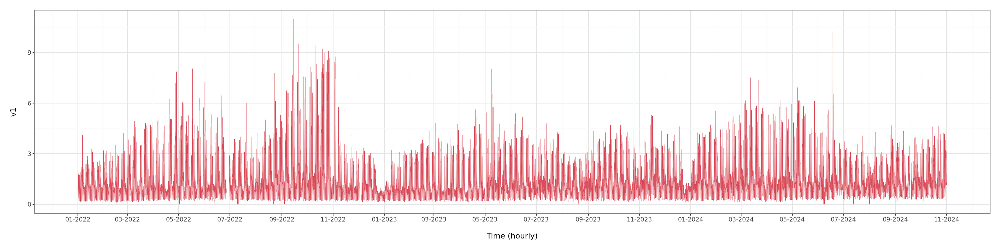

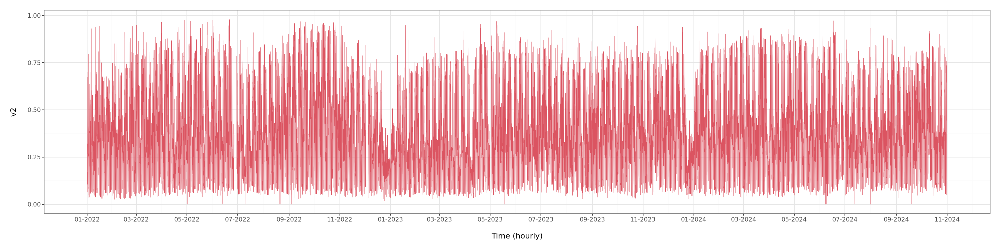

In [11]:
display(
    ggplot(data.iloc[:-fc_period,:], aes(x='ts', y='v1'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='2 month', date_labels='%m-%Y')
)

display(
    ggplot(data.iloc[:-fc_period,:], aes(x='ts', y='v2'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='2 month', date_labels='%m-%Y')
)

We can also assess the lack of trend claim more formally, that is with a LOWESS plot added to the chart. As we can see, the LOWESS-trend estimates are very close to a simple horizontal line. Thus, I will fit the models without a trend. I do this as even though the models would be capable of assigning a trend to the data, I believe it would be rather overfitting to noise (especially in the case of Prophet, with its flexible trend lines).

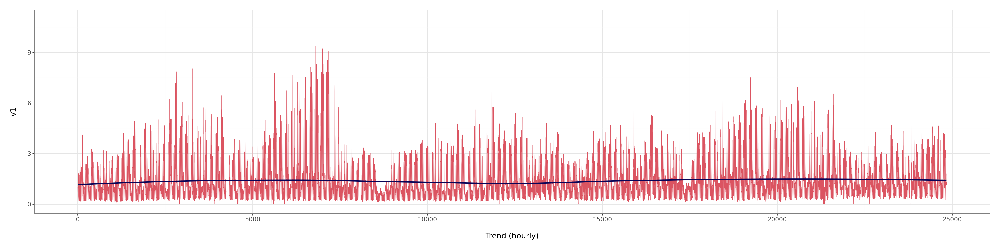

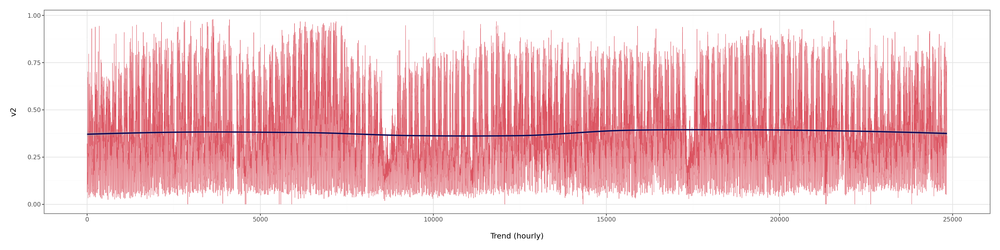

In [12]:
display(
    ggplot(data.iloc[:-fc_period,:], aes(x='trend', y='v1'))
    + geom_line(color=color[0], size=0.25)
    + geom_smooth(method='loess', color=color[1], size=1)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Trend (hourly)')
)

display(
    ggplot(data.iloc[:-fc_period,:], aes(x='trend', y='v2'))
    + geom_line(color=color[0], size=0.25)
    + geom_smooth(method='loess', color=color[1], size=1)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Trend (hourly)')
)

Let's look at only one year, 2023 now. As we can see, there are weekly fluctuations in both series. There is also a clear drop around the winter holidays and in the summer months, suggesting the need for monthly seasonality as well.

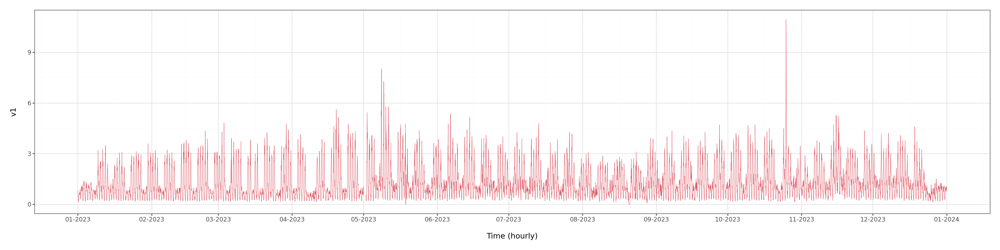

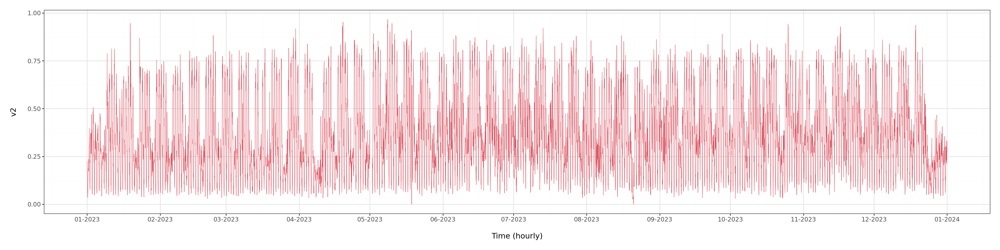

In [13]:
display(
    ggplot(data[data['year'] == 2023], aes(x='ts', y='v1'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='1 month', date_labels='%m-%Y')
)
display(
    ggplot(data[data['year'] == 2023], aes(x='ts', y='v2'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='1 month', date_labels='%m-%Y')
)

Let's move one unit down again: a specific month, June of 2023. Now we can see that there is daily seasonality in both series as well, with a clear distinction between weekdays and weekends.

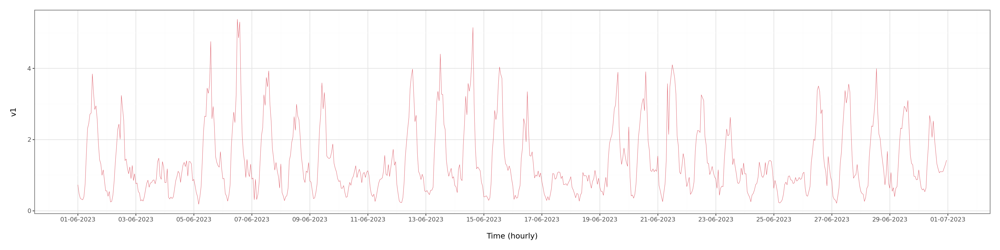

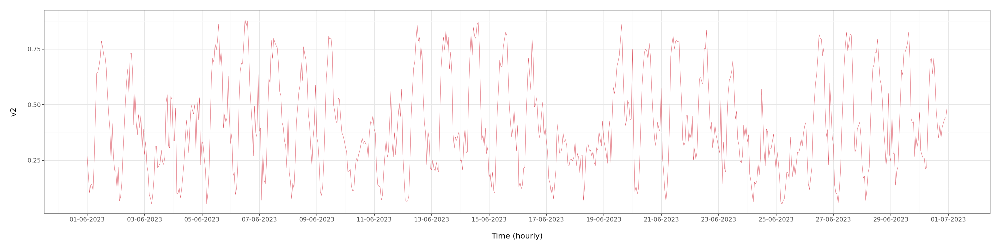

In [14]:
display(
    ggplot(data[(data['year'] == 2023) & (data['month'] == 6)], aes(x='ts', y='v1'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='2 day', date_labels='%d-%m-%Y')
)
display(
    ggplot(data[(data['year'] == 2023) & (data['month'] == 6)], aes(x='ts', y='v2'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
    + scale_x_datetime(date_breaks='2 day', date_labels='%d-%m-%Y')
)

Let's look at a specific day as well! We can see an hourly seasonality, with peaks during working hours, and drops outside in both series.

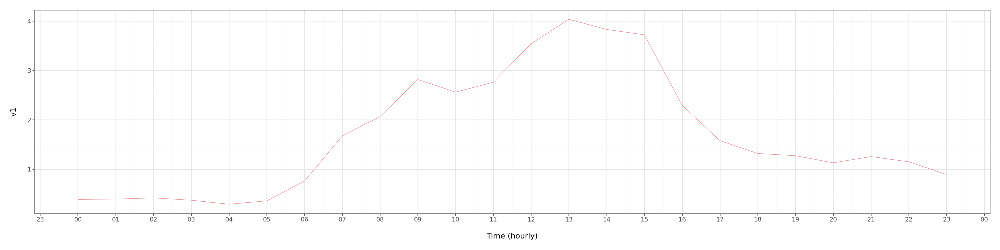

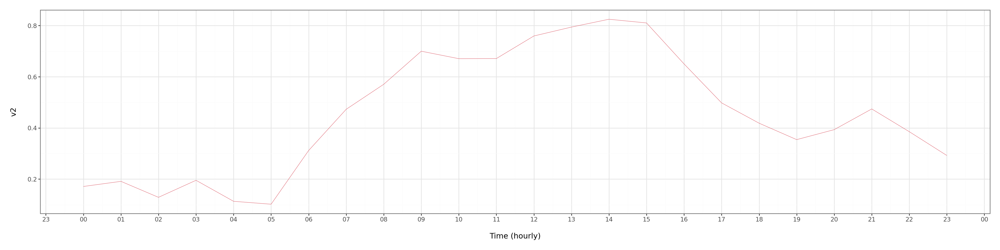

In [15]:
display(
    ggplot(data[(data['year'] == 2023) & (data['month'] == 6) & (data['day'] == 15)], aes(x='ts', y='v1'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + scale_x_datetime(date_breaks='1 hour', date_labels='%H')
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
)
display(
    ggplot(data[(data['year'] == 2023) & (data['month'] == 6) & (data['day'] == 15)], aes(x='ts', y='v2'))
    + geom_line(color=color[0], size=0.25)
    + theme_bw()
    + scale_x_datetime(date_breaks='1 hour', date_labels='%H')
    + theme(figure_size=(20, 5))
    + labs(x='Time (hourly)')
)

Looking at the overall distribution of the series, we can see left-skewed distributions, especially for `v1`. We can also see that there are some zero values at the lower bounds of the distributions. Looking at the above time series plots, we can see that when these drops to zeros happened, was quite random - thus we might consider these as erronous as well. So we should definitely do something about the extreme and errounous values. Initially I experimented with log transformation or simple winsorization, but in the end, simply setting these to missing and imputing it with Prophet proved to be the best option (as per the holdout performance). Thus, I only present this latter solution.

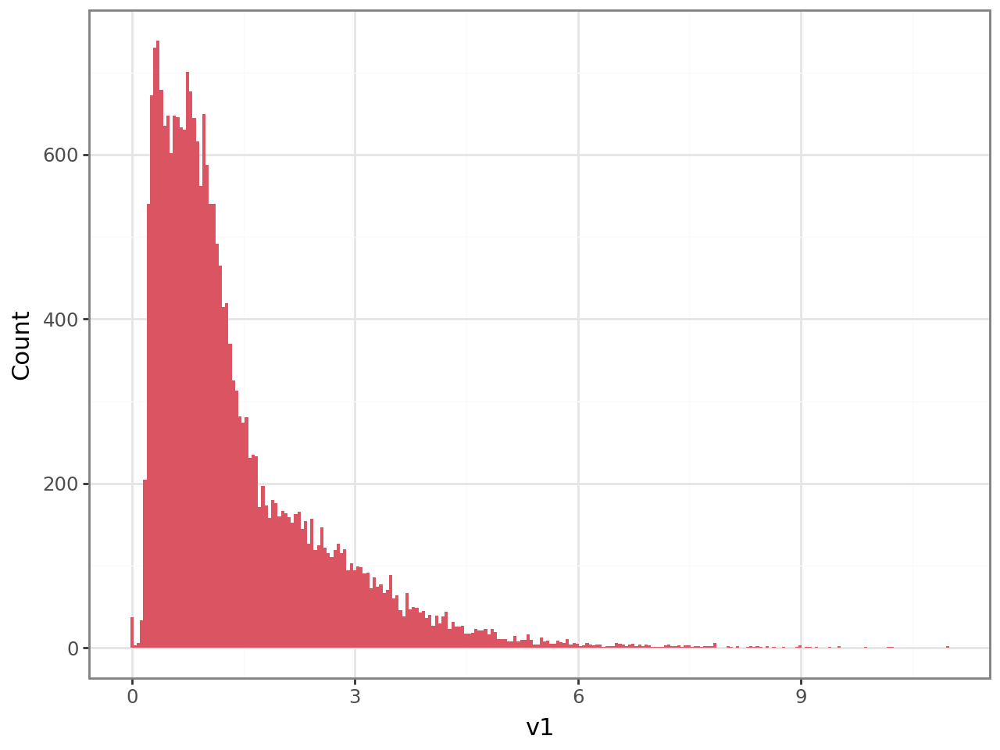

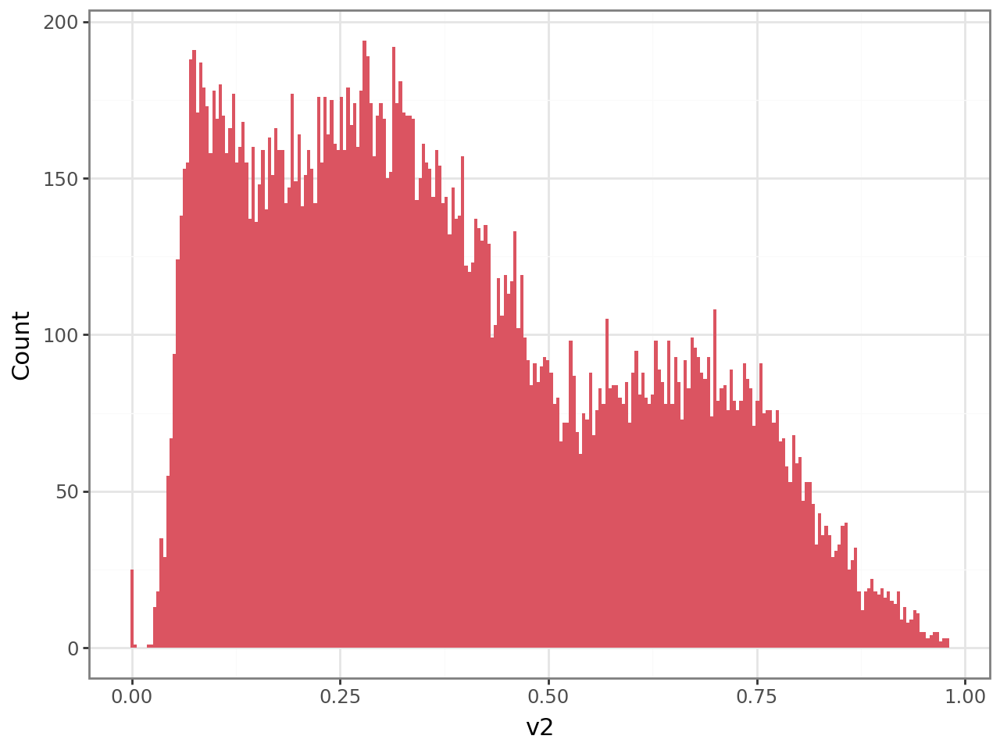

In [16]:
display(
    ggplot(data, aes(x = 'v1'))
    + geom_histogram(fill=color[0], color=None, bins=250)
    + theme_bw()
    + labs(y = 'Count')
)

display(
    ggplot(data, aes(x = 'v2'))
    + geom_histogram(fill=color[0], color=None, bins=250)
    + theme_bw()
    + labs(y = 'Count')
)

In [11]:
data[['v1', 'v2', 'v1_imputed', 'v2_imputed']].describe(percentiles=[0.005, 0.01, 0.05, 0.1, 0.25, 0.5, 0.75, 0.90, 0.95, 0.99, 0.995]).T.round(4)

,count,mean,std,min,0.5%,1%,5%,10%,25%,50%,75%,90%,95%,99%,99.5%,max
v1,24592.0,1.3858,1.1546,0.0,0.1712,0.1933,0.2694,0.3433,0.5927,1.0170,1.8211,2.9795,3.6918,5.3872,6.3057,10.9699
v2,24592.0,0.3808,0.2261,0.0,0.0413,0.0492,0.0756,0.1033,0.1949,0.3399,0.5543,0.7239,0.7864,0.8881,0.9158,0.9789
v1_imputed,24840.0,1.3843,1.1512,0.0,0.1713,0.1934,0.2698,0.3439,0.5941,1.0183,1.8150,2.9708,3.6850,5.3804,6.3008,10.9699
v2_imputed,24840.0,0.3806,0.2256,0.0,0.0414,0.0494,0.0758,0.1035,0.1953,0.3399,0.5528,0.7230,0.7859,0.8879,0.9154,0.9789


As described above, I create new variables for which the lower and upper bounds (0.5th and 99th percentile) are replaced by missing values - these will be imputed later by Prophet. What we gain with this approach is that the models will not try to predict these very extreme cases (so we will miss these), but in return, our predictions on the *base* cases may be more precise. Of course, if in the live data there are disproportionately many extreme cases, then our model will perform poorly - but that is a very unlikely scenary, thus I am comfortable taking this risk.

In [12]:
data['proph_v1'] = data['v1'].apply(lambda x:
                                   np.nan
                                   if pd.isna(x)
                                   else (np.nan
                                         if x > np.nanquantile(data['v1'], 0.99)
                                         else (
                                           np.nan
                                           if x < np.nanquantile(data['v1'], 0.005)
                                           else x)))
data['proph_v2'] = data['v2'].apply(lambda x:
                                   np.nan
                                   if pd.isna(x)
                                   else (np.nan
                                         if x > np.nanquantile(data['v2'], 0.99)
                                         else (
                                           np.nan
                                           if x < np.nanquantile(data['v2'], 0.005)
                                           else x)))

To examine whether there is a need for actually using differences in my analysis, I clean the series from trends, hourly, weekly and monthly seasonality, and calculate the ADF stationarity test on the residuals. This shows that the series are stationary after being cleaned from the above factors, thus using differences is unnecessary. I also test the Granger-causality between the two residuals: the results show that using VAR models my be justified as there is a Granger-causal relationship between the residuals.

I do not test for serial correlation in the residuals. This is simply because our forecast period is too long (720 periods) for ARIMA models to perform well. Thus I will not build ARIMA models.

In [13]:
df_v1 = data.iloc[:-fc_period,:][['ts', 'v1_imputed']].rename(columns={'ts': 'ds', 'v1_imputed': 'y'})
df_v2 = data.iloc[:-fc_period,:][['ts', 'v2_imputed']].rename(columns={'ts': 'ds', 'v2_imputed': 'y'})

prophet_v1 = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True, growth='flat')
prophet_v2 = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True, growth='flat')

prophet_v1.fit(df_v1)
prophet_v2.fit(df_v2)

future = df_v1[['ds']]
forecast_v1 = prophet_v1.predict(future)
forecast_v2 = prophet_v2.predict(future)

df_v1['v1_resid'] = df_v1['y'] - forecast_v1['yhat']
df_v2['v2_resid'] = df_v2['y'] - forecast_v2['yhat']


12:18:55 - cmdstanpy - INFO - Chain [1] start processing
12:18:55 - cmdstanpy - INFO - Chain [1] done processing
12:18:56 - cmdstanpy - INFO - Chain [1] start processing
12:18:57 - cmdstanpy - INFO - Chain [1] done processing


In [14]:
v1_stat_test = adfuller(df_v1['v1_resid'], maxlag=24, regression='c', autolag='AIC', store=False, regresults=False)
v2_stat_test = adfuller(df_v2['v2_resid'], maxlag=24, regression='c', autolag='AIC', store=False, regresults=False)
print('ADF stationarity test:\n    H0: Process is non-stationary (unit root present).\n    H1: Process is stationary.')
print('Note: variables cleaned from daily, weekly and monthly seasonality (assuming no trend) by Prophet, ADF results for residuals.')
print(f'v1 (imputed) p-value: {v1_stat_test[1]:.4f}')
print(f'v2 (imputed) p-value: {v2_stat_test[1]:.4f}')

ADF stationarity test:
    H0: Process is non-stationary (unit root present).
    H1: Process is stationary.
Note: variables cleaned from daily, weekly and monthly seasonality (assuming no trend) by Prophet, ADF results for residuals.
v1 (imputed) p-value: 0.0000
v2 (imputed) p-value: 0.0000


In [15]:
print('Granger-causality test (direction v2 -> v1):\n    H0: v2 does not Granger-cause v1.\n    H1: v2 does Granger-cause v1.')
print('Note: variables cleaned from daily, weekly and monthly seasonality (assuming no trend) by Prophet, results for residuals.')
v1_v2_granger_test = grangercausalitytests(
    x=pd.concat([df_v1['v1_resid'], df_v2['v2_resid']], axis=1).dropna(),
    maxlag=5,
    verbose=True
)
print('\nGranger-causality test (direction v1 -> v2):\n    H0: v1 does not Granger-cause v2.\n    H1: v1 does Granger-cause v2.')
print('Note: variables cleaned from daily, weekly and monthly seasonality (assuming no trend) by Prophet, results for residuals.')
v2_v1_granger_test = grangercausalitytests(
    x=pd.concat([df_v2['v2_resid'], df_v1['v1_resid']], axis=1).dropna(),
    maxlag=5,
    verbose=True
)

Granger-causality test (direction v2 -> v1):
    H0: v2 does not Granger-cause v1.
    H1: v2 does Granger-cause v1.
Note: variables cleaned from daily, weekly and monthly seasonality (assuming no trend) by Prophet, results for residuals.

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=56.9872 , p=0.0000  , df_denom=24836, df_num=1
ssr based chi2 test:   chi2=56.9940 , p=0.0000  , df=1
likelihood ratio test: chi2=56.9288 , p=0.0000  , df=1
parameter F test:         F=56.9872 , p=0.0000  , df_denom=24836, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=31.6264 , p=0.0000  , df_denom=24833, df_num=2
ssr based chi2 test:   chi2=63.2655 , p=0.0000  , df=2
likelihood ratio test: chi2=63.1851 , p=0.0000  , df=2
parameter F test:         F=31.6264 , p=0.0000  , df_denom=24833, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=28.8930 , p=0.0000  , df_denom=24830, df_num=3
ssr based chi2 test:   chi2=

Let's examine further the seasonality present in the series. First, let's look at boxplots broken down by certain time categories - these may be more informative than simply looking at a randomly chosen instance of them.

The monthly boxplots suggest that there is a very slight monthly seasonality in both cases, with drops in the summer and winter months.

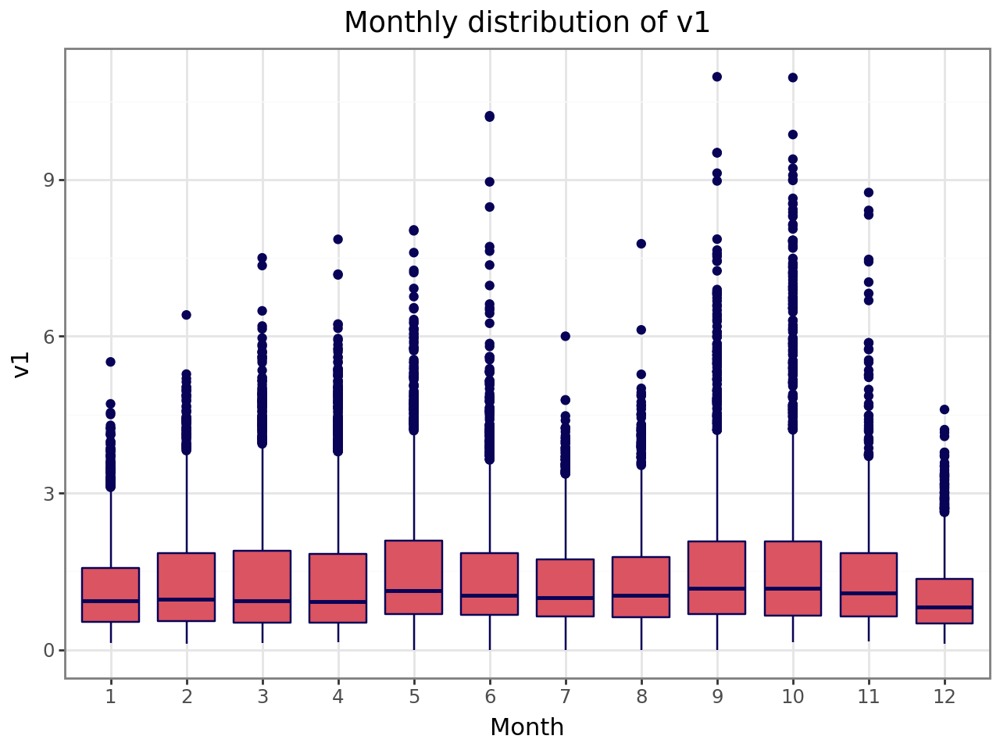

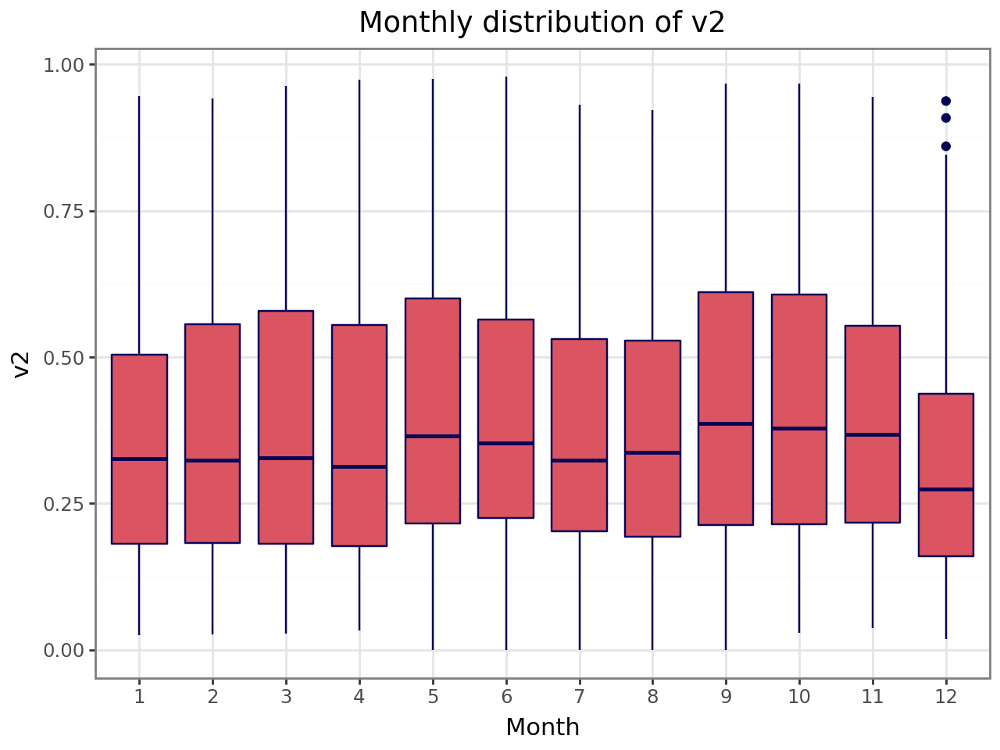

In [22]:
display(
    ggplot(data, aes(x='month.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 13))
    + labs(x = 'Month', title = 'Monthly distribution of v1')
)

display(
    ggplot(data, aes(x='month.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 13))
    + labs(x = 'Month', title = 'Monthly distribution of v2')
)

Regarding the day of the month, there is no difference in distributions (this could have been the other way if, e.g. our variables were related to the purchasing power of people).

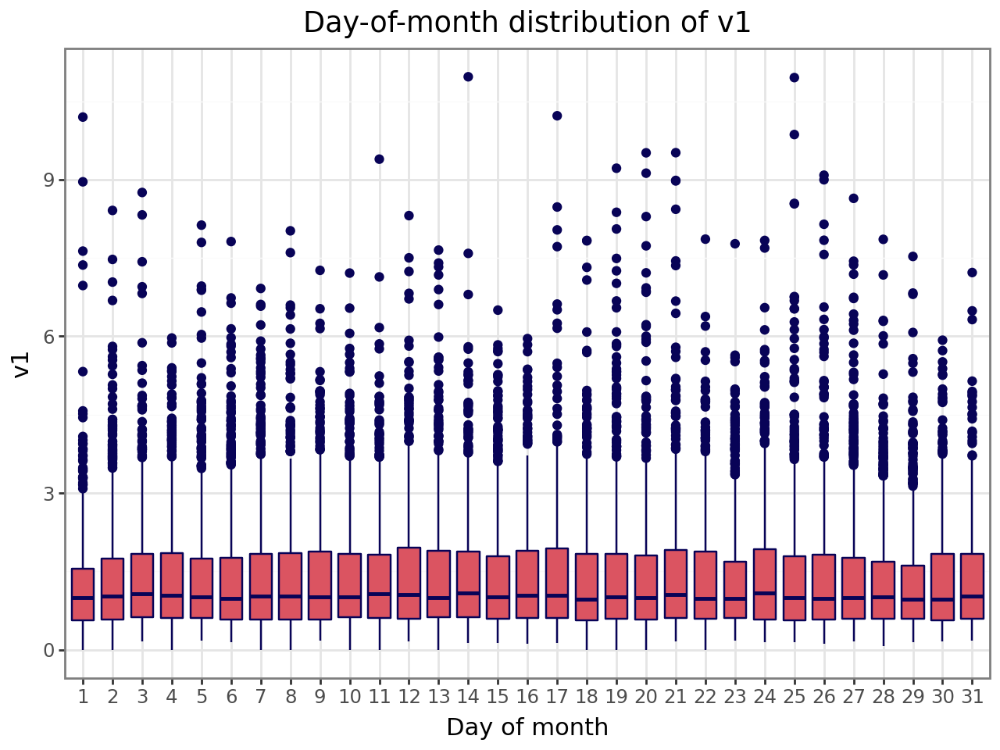

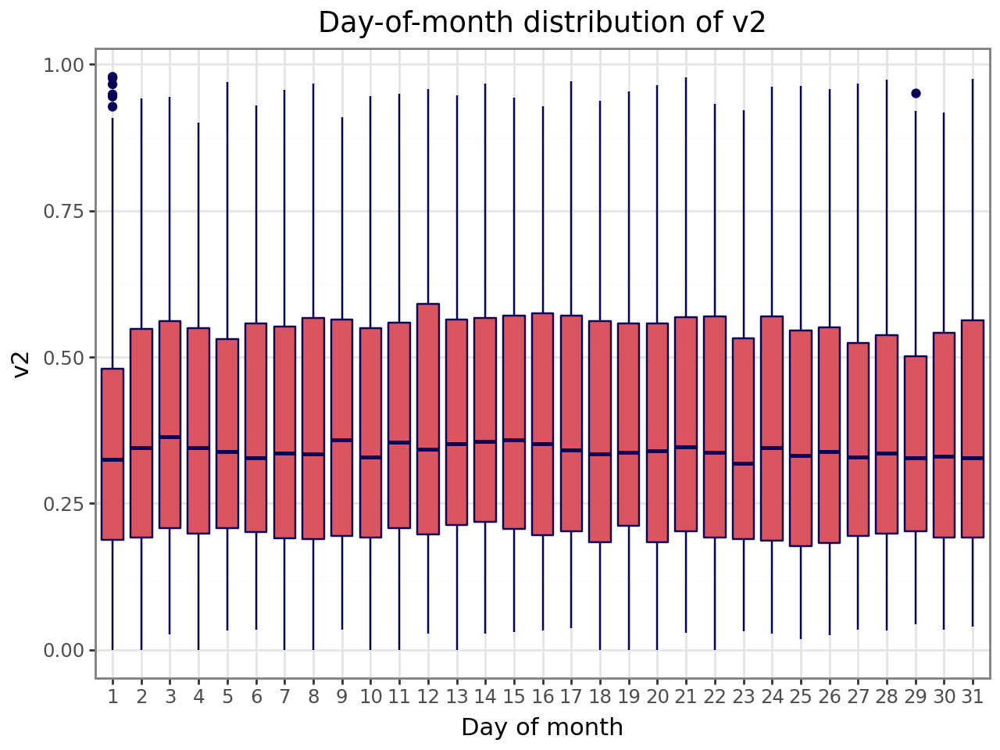

In [23]:
display(
    ggplot(data, aes(x='day.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 32))
    + labs(x = 'Day of month', title = 'Day-of-month distribution of v1')
)

display(
    ggplot(data, aes(x='day.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 32))
    + labs(x = 'Day of month', title = 'Day-of-month distribution of v2')
)

Regarding the day of the week, distributions are rather similar from Monday to Thursday. However, there is a slight drop in the mean on Friday, and weekends are very different for both series.

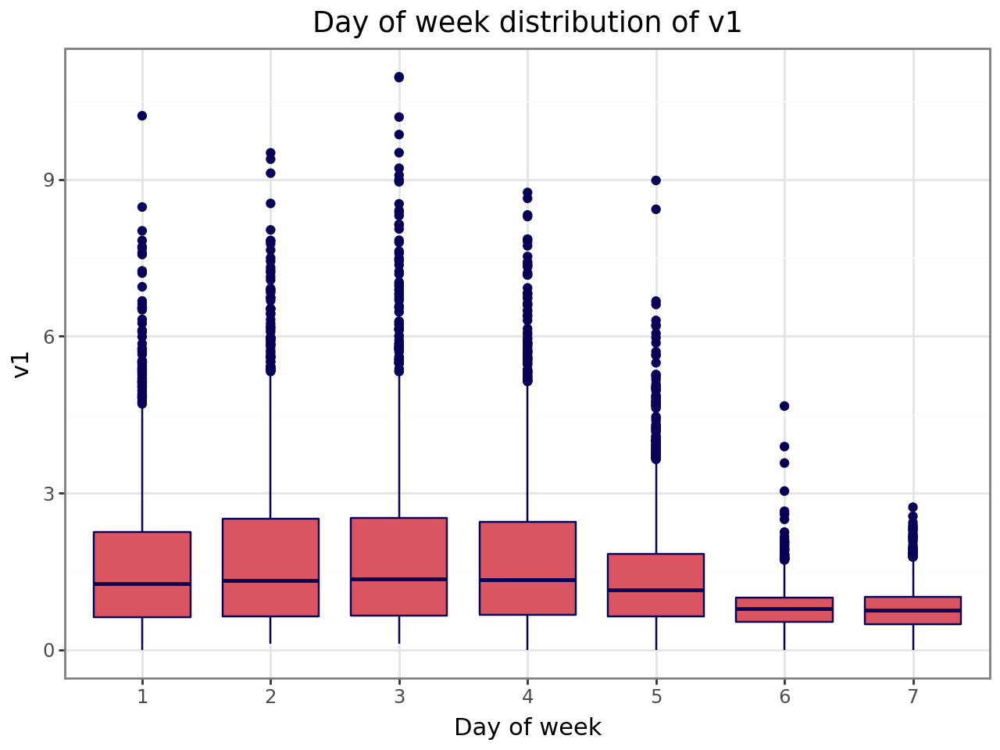

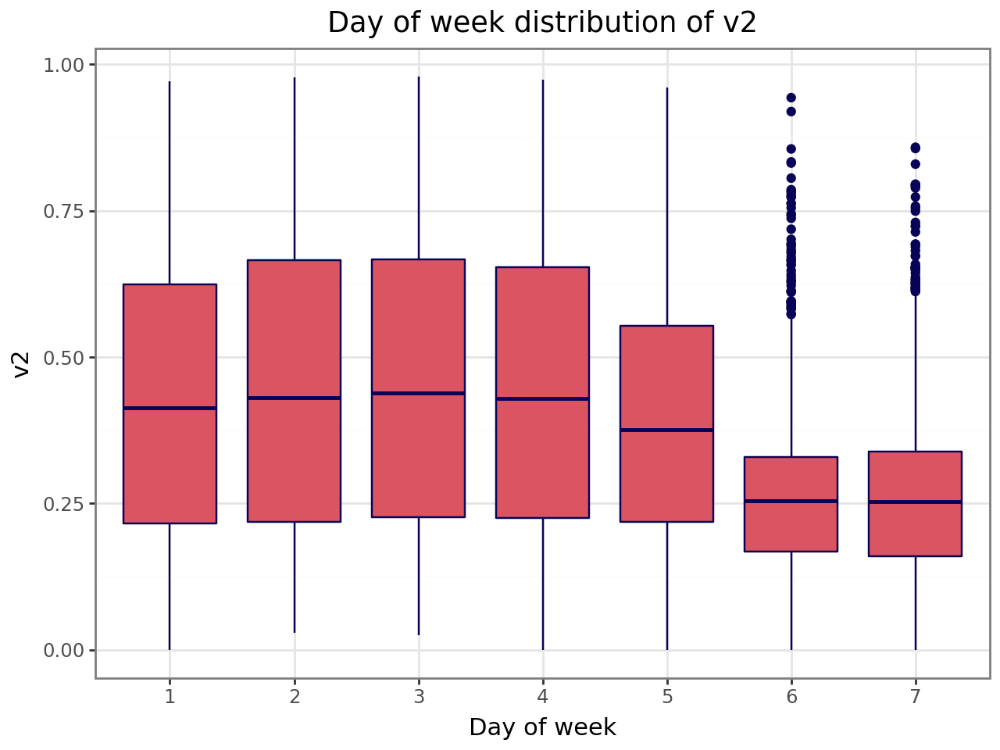

In [24]:
display(
    ggplot(data, aes(x='dow.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 8))
    + labs(x = 'Day of week', title = 'Day of week distribution of v1')
)

display(
    ggplot(data, aes(x='dow.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(1, 8))
    + labs(x = 'Day of week', title = 'Day of week distribution of v2')
)

The above can also be shown if we simply look at the distributions by the weekend dummy.

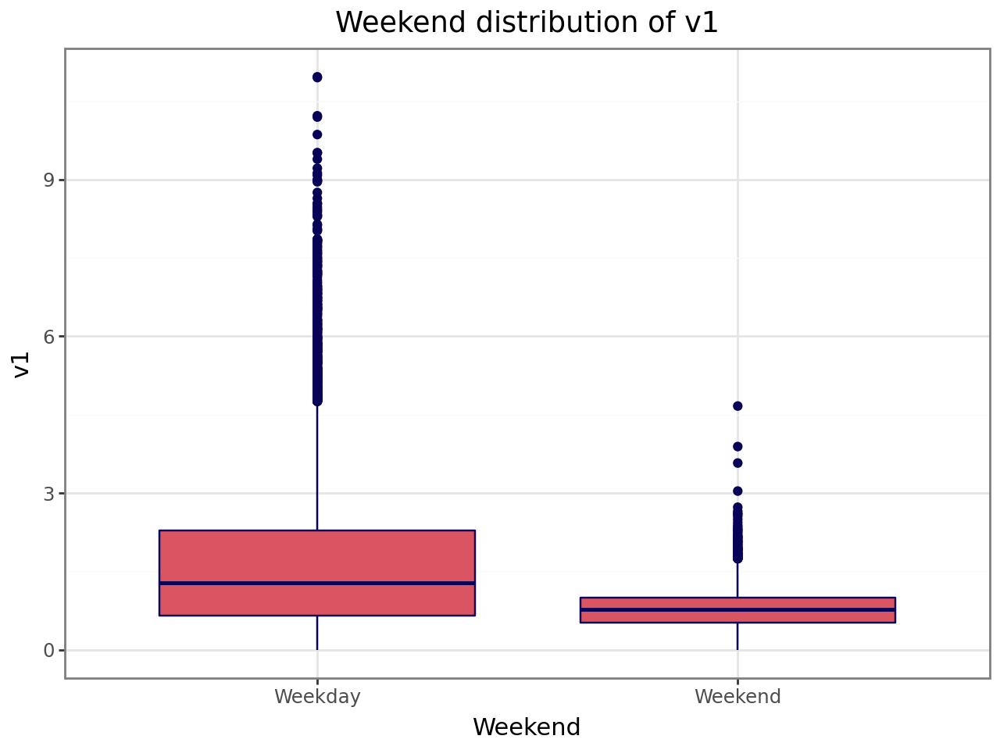

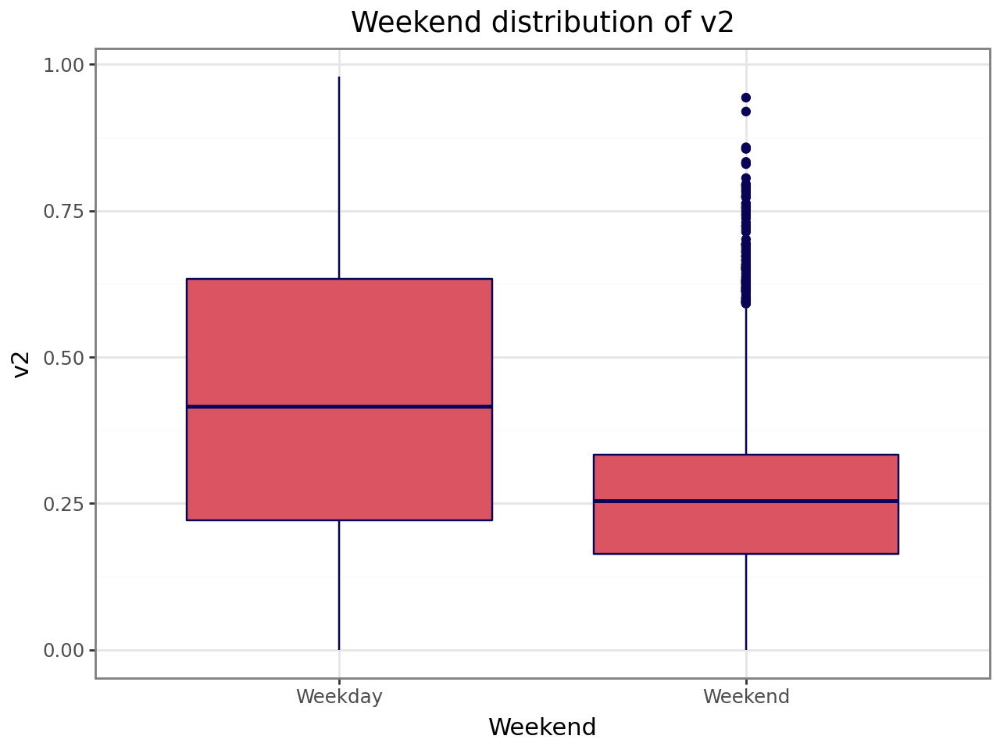

In [25]:
display(
    ggplot(data, aes(x='is_weekend.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Weekday', 'Weekend'])
    + labs(x = 'Weekend', title = 'Weekend distribution of v1')
)

display(
    ggplot(data, aes(x='is_weekend.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Weekday', 'Weekend'])
    + labs(x = 'Weekend', title = 'Weekend distribution of v2')
)

Moreover, there is also a similar pattern for holidays.

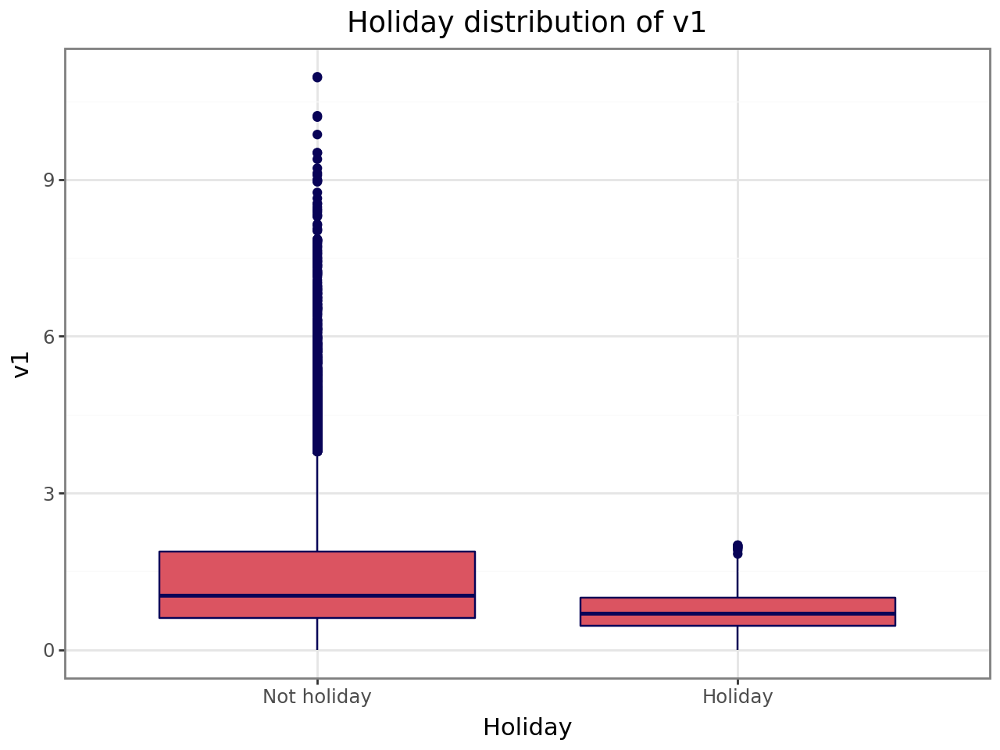

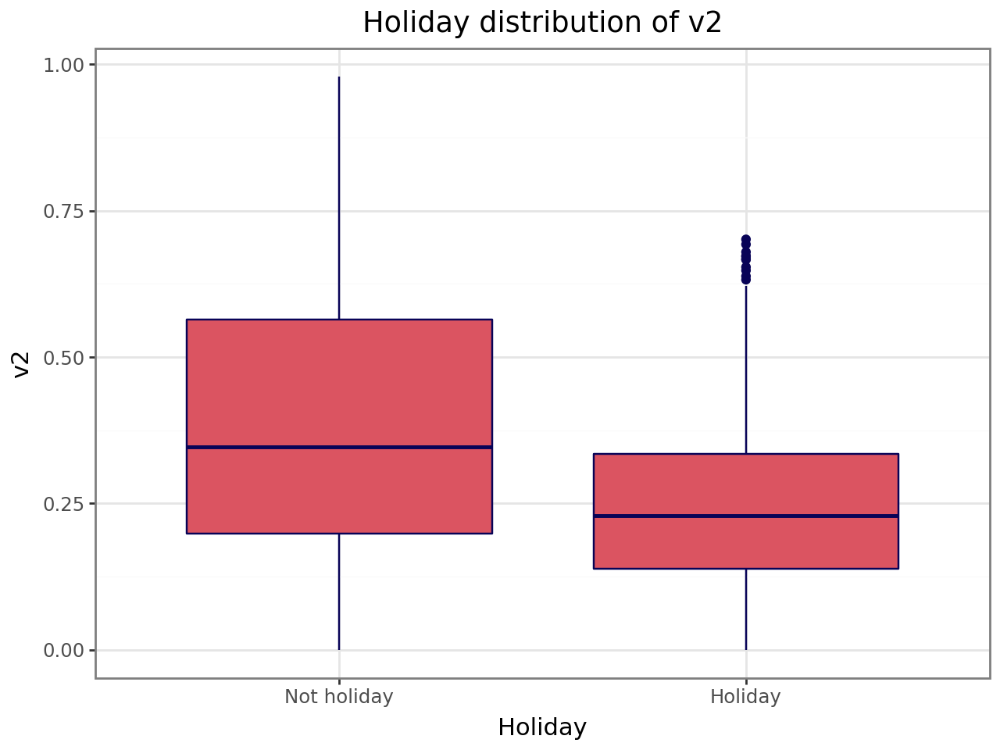

In [26]:
display(
    ggplot(data, aes(x='is_holiday.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Not holiday', 'Holiday'])
    + labs(x = 'Holiday', title = 'Holiday distribution of v1')
)

display(
    ggplot(data, aes(x='is_holiday.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Not holiday', 'Holiday'])
    + labs(x = 'Holiday', title = 'Holiday distribution of v2')
)

We can also exmine whether holidays have different effects depending on what day of the week day fall on. We can see that the drop is the largest on weekdays, slightly smaller on Fridays, and practically nonexistent on weekends. Thus, holiday effects may have to be interacted with the day of the week.

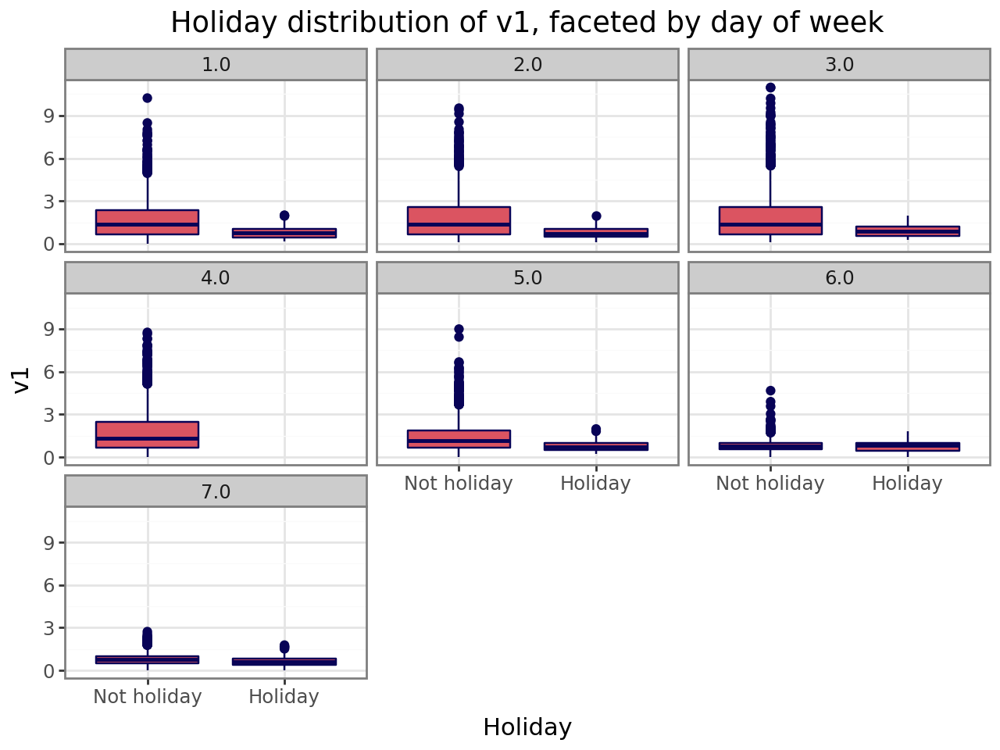

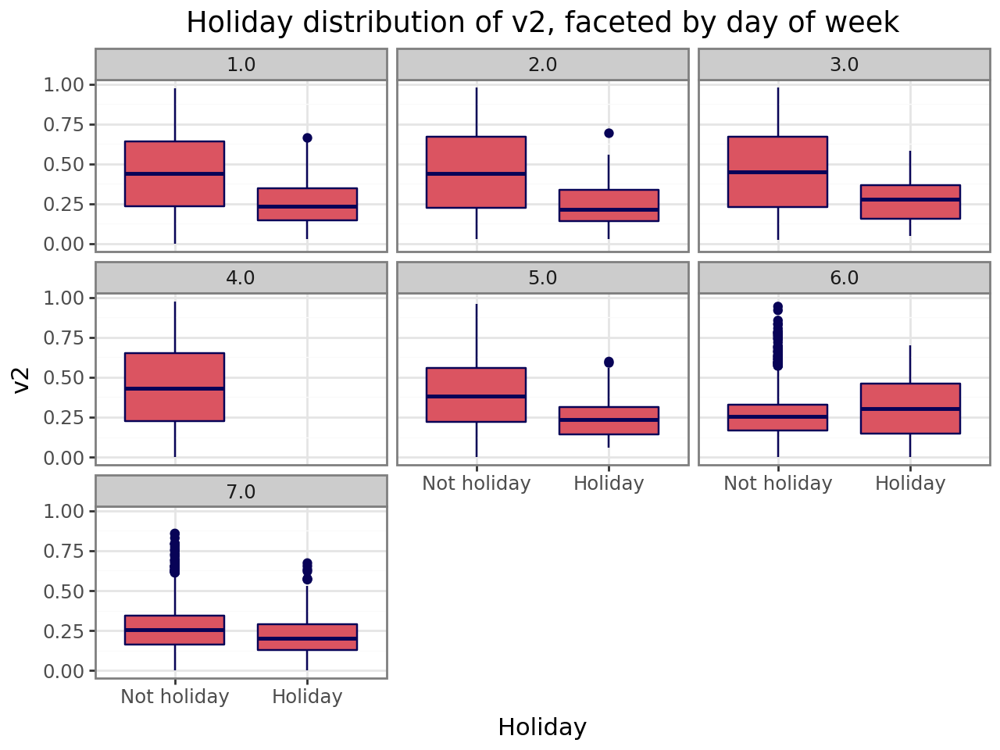

In [27]:
display(
    ggplot(data, aes(x='is_holiday.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Not holiday', 'Holiday'])
    + labs(x = 'Holiday', title = 'Holiday distribution of v1, faceted by day of week')
    + facet_wrap('~dow')
)

display(
    ggplot(data, aes(x='is_holiday.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = ['Not holiday', 'Holiday'])
    + labs(x = 'Holiday', title = 'Holiday distribution of v2, faceted by day of week')
    + facet_wrap('~dow')
)

Most importantly, there are very apparent differences in the hourly distributions.

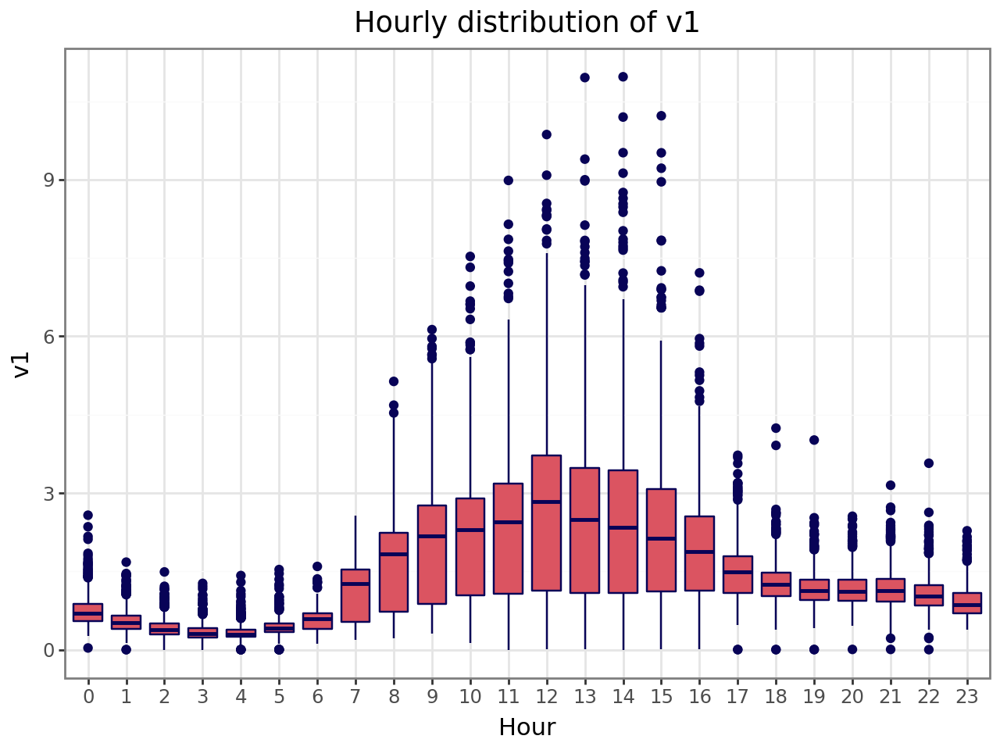

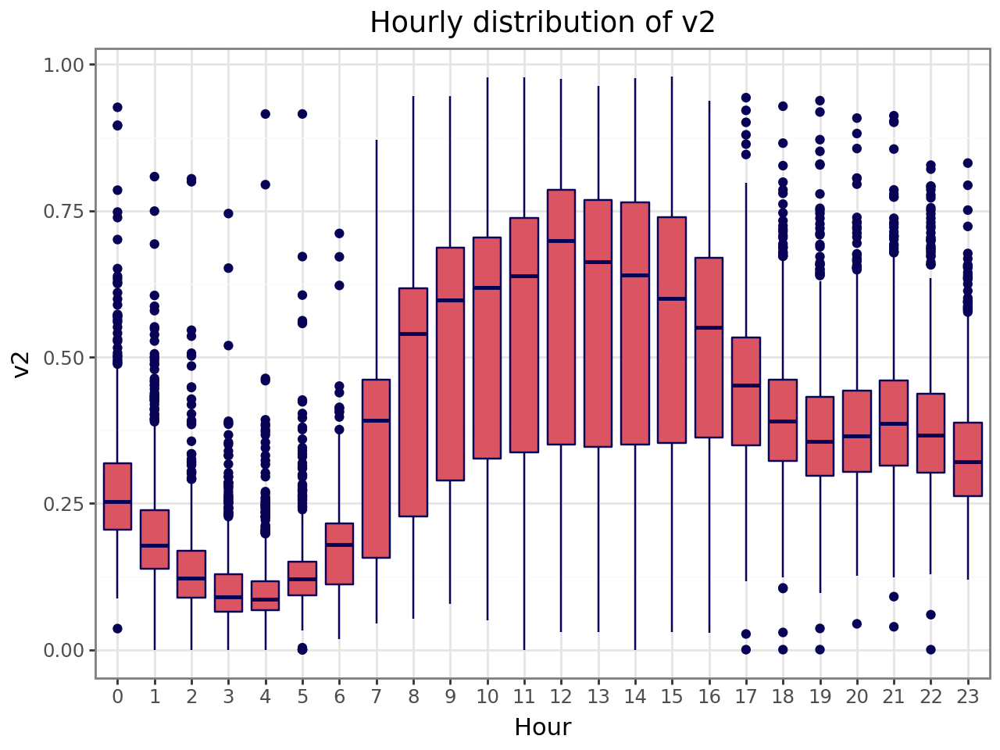

In [28]:
display(
    ggplot(data, aes(x='hour.astype("category")', y = 'v1'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(0, 24))
    + labs(x = 'Hour', title = 'Hourly distribution of v1')
)

display(
    ggplot(data, aes(x='hour.astype("category")', y = 'v2'))
    + geom_boxplot(fill=color[0], color=color[1], outlier_color = color[1])
    + theme_bw()
    + scale_x_discrete(labels = range(0, 24))
    + labs(x = 'Hour', title = 'Hourly distribution of v2')
)

But simply looking at distributions broken down by one variable may not tell the full story, as there may be some important interaction effects going on. To uncover these, we can look at some heatmaps for all the possible variable combinations (except day of week x weekend, as these are mutually exclusive). From the plots below, we can see the following:

- month x day of month: there seems to be no interaction;
- month x hour of the day: it seems that how much the series peak during the day is quite different in January, July, August, and December, so there is an interaction;
- month x day of week: similar differences as previously, so there is an interaction;
- month x weekend: quite similar differences between weekdays and weekends, and even if there is an interaction, it may already be captured by the previous interaction;
- month x holiday: same as before, and moreover, some months do not even have holidays;
- day of the month x hour of the day: very similar patterns all across, thus no interaction needed;
- day of month x day of week: same as above, no interactions;
- day of month x weekend: same as above, no interaction;
- day of month x holiday: same as above, no interaction;
- hour of the day x day of week: on Fridays and weekends the patterns are quite different, thus there is an interaction;
- hour of the day x weekend: because of the above, there is a difference here as well, but it may be already captured by the previous interaction;
- hour of the day x holiday: holidays seem to have different patterns, so there is an interaction;
- day of week x holiday: similarly to above, there seems to be an interaction;
- weekend x holiday: important differences, so there may be an interaction (but this may be captured by the previous interaction).

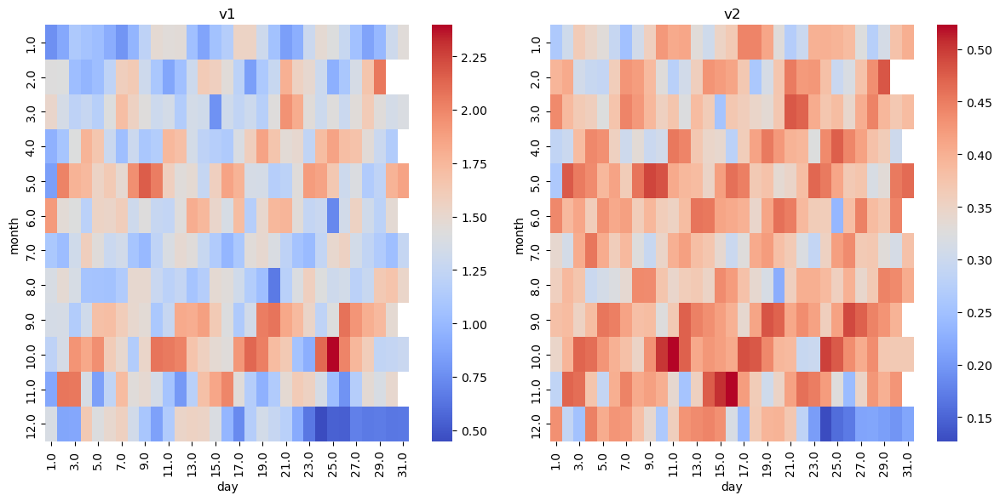

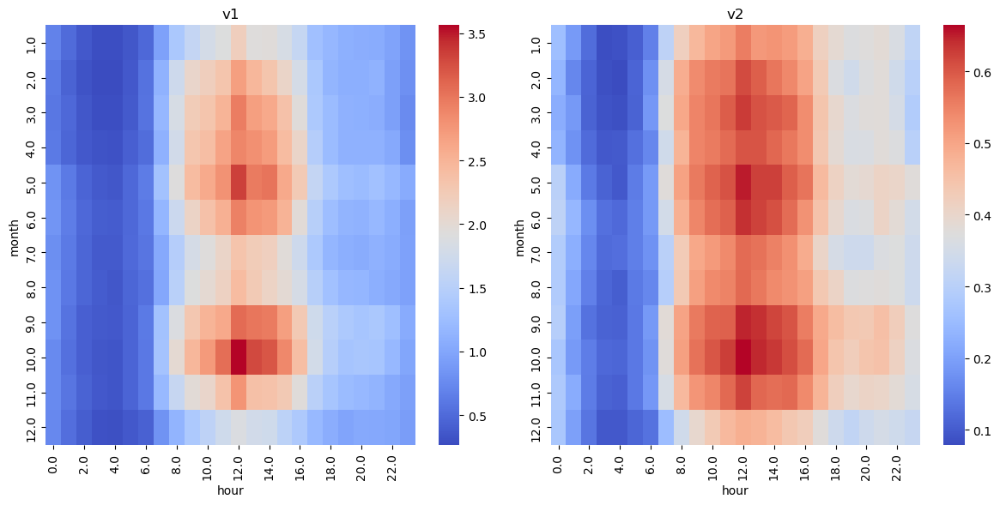

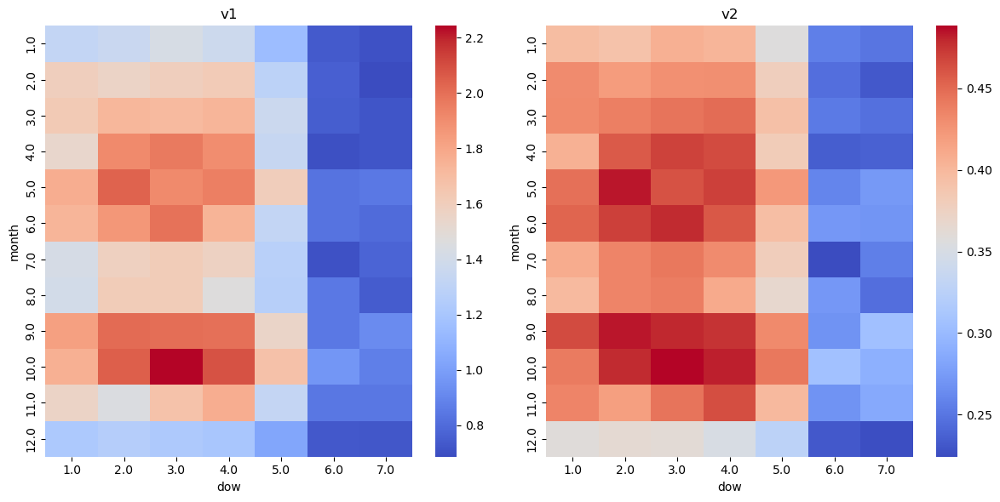

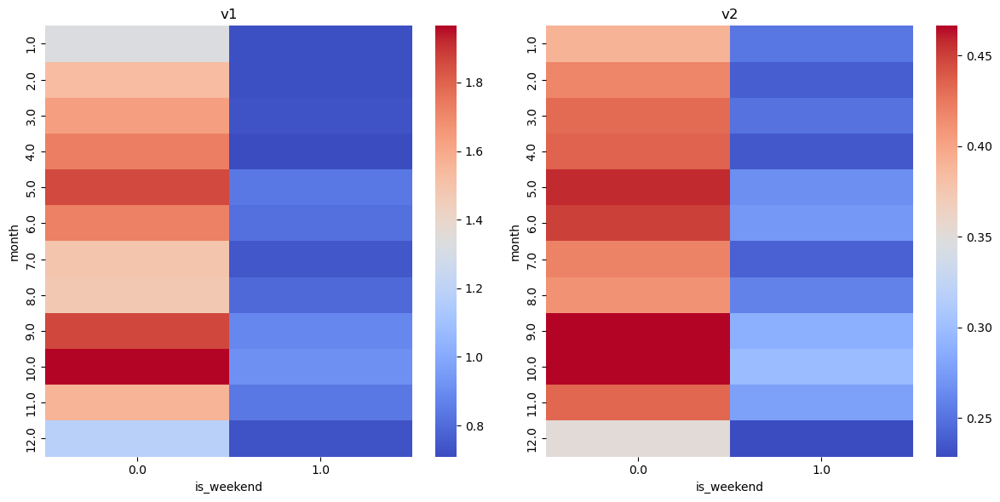

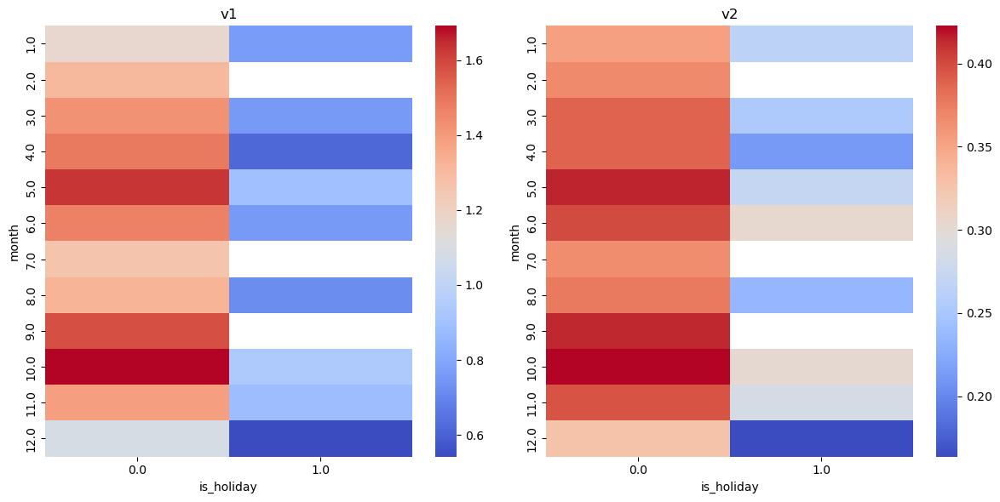

...

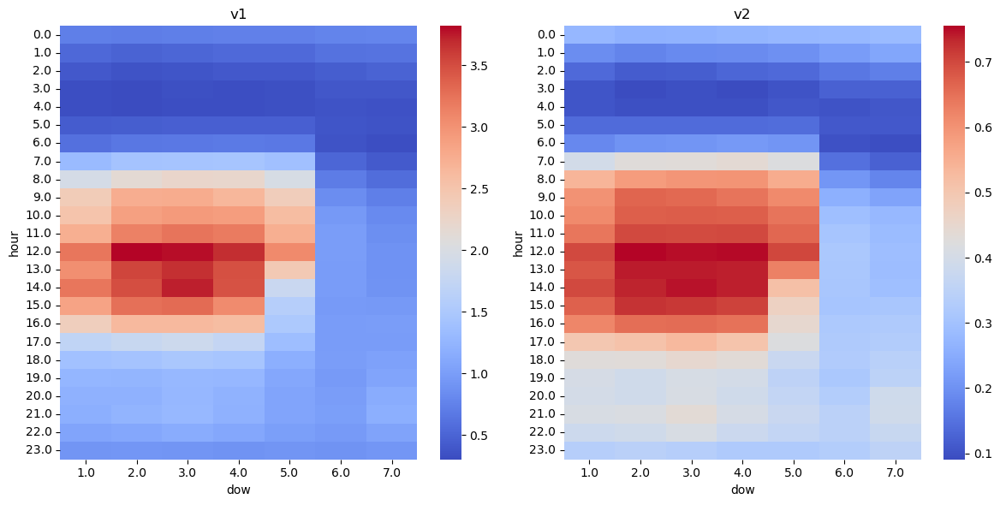

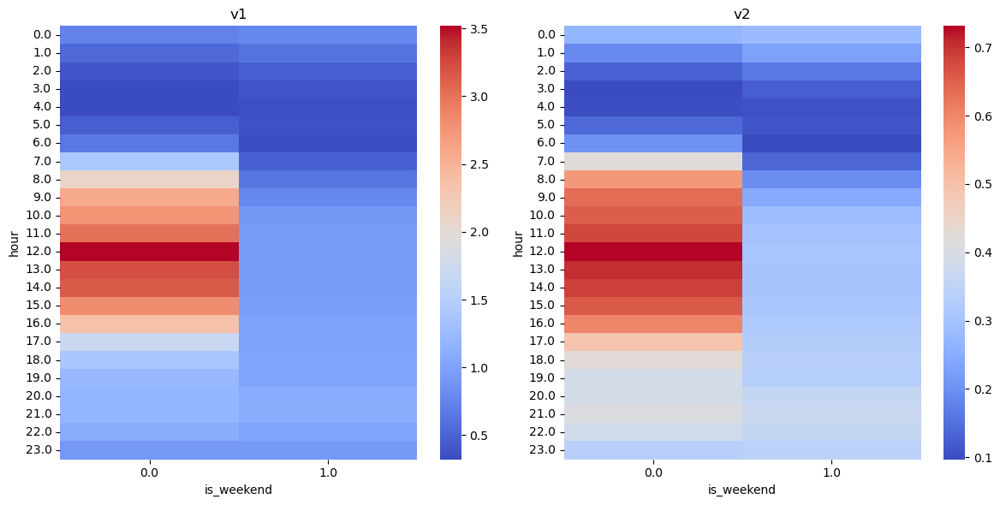

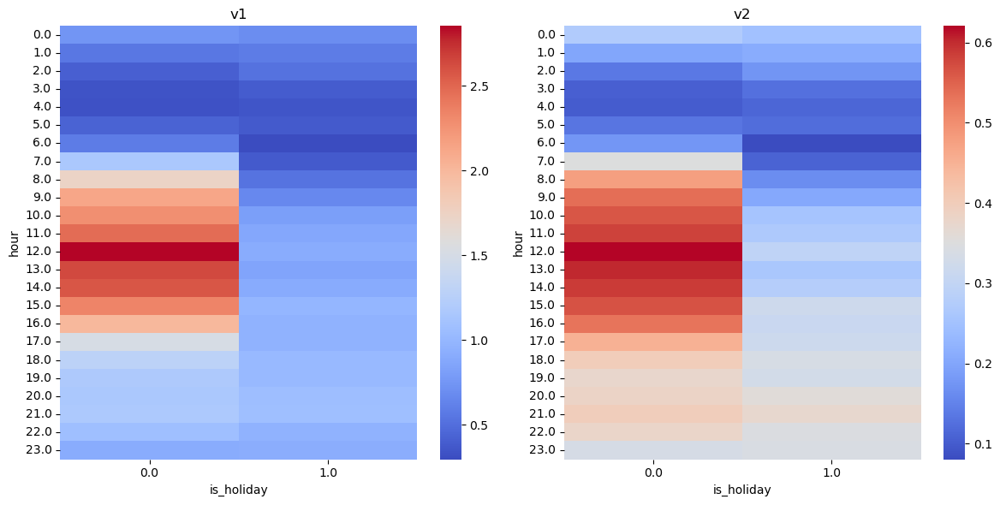

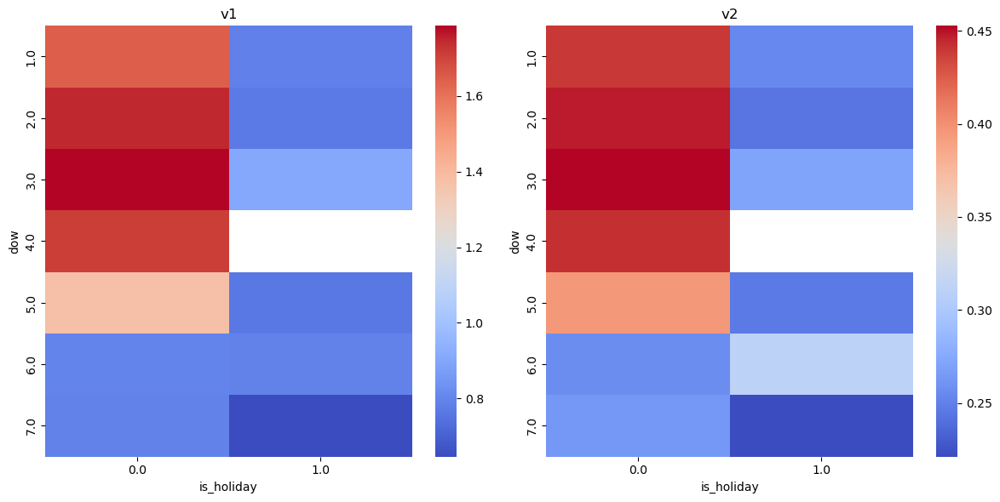

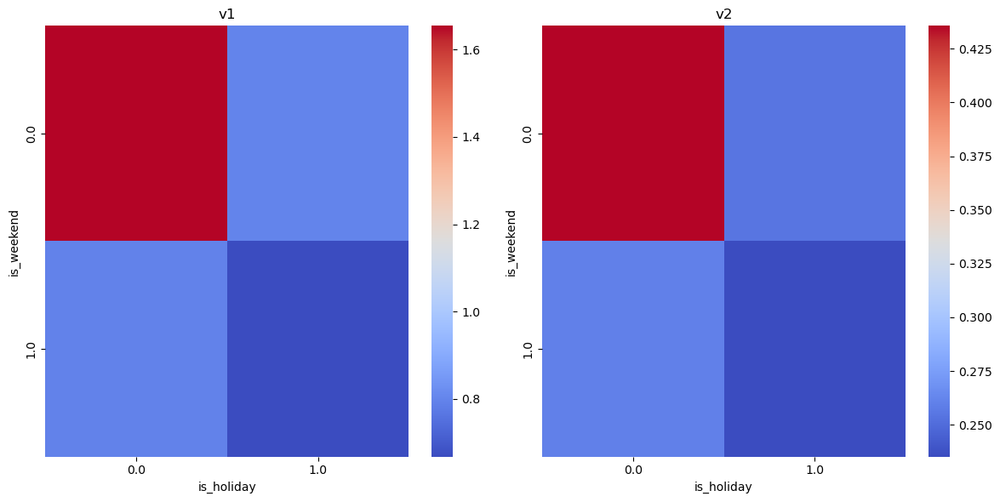

In [29]:
time_vars = ['month', 'day', 'hour', 'dow', 'is_weekend', 'is_holiday']
for i in range(len(time_vars)):
    for j in range(i + 1, len(time_vars)):
        if not (time_vars[i] == 'dow' and time_vars[j] == 'is_weekend'):
            fig, axes = plt.subplots(1, 2, figsize=(12, 6))
            sns.heatmap(
                data = data.iloc[:-fc_period,:].pivot_table(index=time_vars[i], columns=time_vars[j], values="v1", aggfunc='mean'), 
                cmap = 'coolwarm',
                ax = axes[0])
            axes[0].set_title('v1')
            sns.heatmap(
                data = data.iloc[:-fc_period,:].pivot_table(index=time_vars[i], columns=time_vars[j], values="v2", aggfunc='mean'), 
                cmap = 'coolwarm',
                ax = axes[1])
            axes[1].set_title('v2')
            plt.tight_layout()
            plt.show()

Based on the above, we can define the following interaction terms: `month x hour`, `month x dow`, `hour x dow`, `hour x is_holiday`, `dow x is_holiday`. However, if we were to include all these interactions (as well as the needed categories with dummies), we would have more than 600 dummy features in our dataset. This may be too much given that our training set will have around 20K observations. So, instead, let's create some groupings based on the above heatmaps.

Note, that in Prophet models we will not model these as interactions, but rather conditional seasonalities (that is e.g. different hourly seasonality by part of the year).

In [16]:
# part of year (month)
data['is_winter'] = data['month'].apply(lambda x: 1 if x in [12, 1] else 0)
data['is_summer'] = data['month'].apply(lambda x: 1 if x in [7, 8] else 0)
data['is_not_win_sum'] = data['month'].apply(lambda x: 1 if x in [2, 3, 4, 5, 6, 9, 10, 11] else 0)
# part of day (hour)
data['is_working_hours'] = data['hour'].apply(lambda x: 1 if x in range(8, 18) else 0)
data['is_off_hours'] = data['hour'].apply(lambda x: 1 if x in range(0, 8) or x in range(18, 24) else 0)
# part of week (plus is_weekend) (dow)
data['is_friday'] = data['dow'].apply(lambda x: 1 if x == 5 else 0)
data['is_weekday'] = data['dow'].apply(lambda x: 1 if x in range(1, 5) else 0)
# holiday x part of week
data['is_holiweekday'] = data['is_holiday'] * ((data['is_weekday'] + data['is_friday']) > 0).astype(int)
data['is_holiweekend'] = data['is_holiday'] * data['is_weekend']

As Prophet models cannot handle two conditional seasonalities by the same condition (e.g. different daily and weekly seasonality based on the part of the year), I duplicate some variables.

In [17]:
data['is_winter2'] = data['is_winter']
data['is_summer2'] = data['is_summer']
data['is_not_win_sum2'] = data['is_not_win_sum']

Let's also create seasonal interaction variables for our non-Prophet models.

In [18]:
# month x hour
data['winter_x_working_hours'] = data['is_winter'] * data['is_working_hours']
data['summer_x_working_hours'] = data['is_summer'] * data['is_working_hours']
# month x dow
data['winter_x_friday'] = data['is_winter'] * data['is_friday']
data['summer_x_friday'] = data['is_summer'] * data['is_friday']
data['winter_x_weekend'] = data['is_winter'] * data['is_weekend']
data['summer_x_weekend'] = data['is_summer'] * data['is_weekend']
# hour x dow
data['working_hours_x_friday'] = data['is_working_hours'] * data['is_friday']
data['working_hours_x_weekend'] = data['is_working_hours'] * data['is_weekend']
# hour x is_holiday
data['working_hours_x_holiday'] = data['is_working_hours'] * data['is_holiday']
# dow x is_holiday -> already created by e.g. is_holiweekday

I create dummies from the month, day of week, and hour variables (that have shown seasonal patterns). These will only be used in tree-based models, thus I include all categories.

In [19]:
data = pd.concat([
    data, 
    pd.get_dummies(data['month'], prefix='month', drop_first=False).astype(int),
    pd.get_dummies(data['dow'], prefix='dow', drop_first=False).astype(int),
    pd.get_dummies(data['hour'], prefix='hour', drop_first=False).astype(int)
], axis=1)

Lastly, I save the prepped datafile.

In [34]:
data.to_pickle('data_prepped.pkl')

# Checkpoint 1: Run from here for prepped data.

In [2]:
data = pd.read_pickle('data_prepped.pkl')

Now we can define the train and holdout sets. I reserve the last month in my sample as a hold-out set.

Some technical notes:

- `data_live` means the period of November 2024, where I will have to make the final forecast;
- `data_given` means the full sample I have;
- `data_holdout` means the last period of `data_given`, reserved as hold-out set (I reserve only one month, as I will have to do the final forecast for one month only);
- `data_train` is the part of `data_given` with which I perform the cross-validation.

In [3]:
data_live = data[(data['year'] == 2024) & (data['month'] == 11)]
data_given = data[(data['year'] != 2024) | (data['month'] != 11)]
data_holdout = data_given[(data_given['year'] == 2024) & (data_given['month'] == 10)]
data_train = data_given[(data_given['year'] != 2024) | (data_given['month'] != 10)]

I do not create a *leave one group out* cross-validation method, as I will cross-validate all models based on the Prophet method (which is a variation of the `sklearn` `TimeSeriesSplit` option).

# Modeling - Prophet

Now we can start modeling. I will begin with Prophet models as these are needed for imputation and extreme value management.

Note that for simplicity, I will score all of my models by RMSE - but this should theoretically yield exactly the same results as scoring be $R^{2}$, so I am still targeting how my forecasts will be evaluated in the competition.

# Checkpoint 2: Run until the next checkpoint only if retraining Prophet models.

Now we can cross-validate some Prophet models. I will CV two parameters suggested by the docs (these effectively regularize seasonality strength), the fourier order of conditional seasonalities and the number of conditional seasonalities to include in the model. I will not cross-validate the regularization for the trend line, as I fit models without a trend line. I do this because even though they would provide better in-sample fits, they might overfit on noise (as we have seen that there is no trend in either of the variables).

I turn the default weekly and daily seasonalities off as I create conditional seasonalities for these. I will cross-validate the models with a self-made function to allow parallel processing.

The cross-validation happens the following way: initially, the model is fitted on 1 year of data, and evaluated on the next 30 days. Next, the model is refitted on 1.33 years of data, and evaluated again on the following 30 days. This continous until I reach the end of the training sample. I evaluate the models on 30 days as this is the length of my live forecast period.

In [4]:
month_daily_interactions = [{'name':'winter_daily','period':1,'condition_name':'is_winter'},{'name':'summer_daily','period':1,'condition_name':'is_summer'},
                            {'name':'not_win_sum_daily','period':1,'condition_name':'is_not_win_sum'}]
month_weekly_interactions = [{'name':'winter_weekly','period':7,'condition_name':'is_winter2'},{'name':'summer_weekly','period':7,'condition_name':'is_summer2'},
                             {'name':'not_win_sum_weekly','period':7,'condition_name':'is_not_win_sum2'}]
dow_interactions = [{'name':'weekday_daily','period':1,'condition_name':'is_weekday'},{'name':'friday_daily','period':1,'condition_name':'is_friday'},
                    {'name':'weekend_daily','period':1,'condition_name':'is_weekend'}]
holiday_interactions = [{'name':'holiweekday_daily','period':1,'condition_name':'is_holiweekday'},{'name':'holiweekend_daily','period':1,'condition_name':'is_holiweekend'}]

In [5]:
param_grid = {  
    #'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1],
    'holidays_prior_scale': [0.1, 1],
    'fourier_order' : [5, 8],
    'complexity':  [month_weekly_interactions, month_weekly_interactions+month_daily_interactions, month_weekly_interactions+month_daily_interactions+dow_interactions,
                    month_weekly_interactions+month_daily_interactions+dow_interactions+holiday_interactions],
    'variable' : ['proph_v1'],

}
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

I define my own function to evaluate the parameter grid. This is based on the suggestions in the Prophet documentation.

In [6]:
def evaluate_model(params, df):
    """
    Trains a Prophet model with specified hyperparameters and evaluates its performance using cross-validation.

    Parameters:
    -----------
    params : dict
        A dictionary containing model hyperparameters:
        - 'seasonality_prior_scale' (float): Strength of seasonality regularization.
        - 'holidays_prior_scale' (float): Strength of holiday effect regularization.
        - 'variable' (str): The name of the target variable in `df`.
        - 'complexity' (list of dicts): Additional seasonal components, where each dict contains:
            - 'name' (str): Name of the seasonality component.
            - 'period' (float): Period of the seasonality component.
            - 'condition_name' (str): Condition name for the seasonal component.
        - 'fourier_order' (int): Fourier order for additional seasonal components.
    
    df : pandas.DataFrame
        A DataFrame containing time series data with at least two columns:
        - 'ts' (datetime): Timestamps of observations.
        - A target variable specified in `params['variable']`.

    Returns:
    --------
    float
        The root mean squared error (RMSE) of the model based on cross-validation.

    Notes:
    ------
    - The model uses a flat growth trend and additive seasonality.
    - It includes Hungarian public holidays.
    - Cross-validation is performed with an initial training period of 365 days, 
      a validation period of 122 days, and a forecast horizon of 30 days.
    - The LBFGS optimization algorithm is used for faster fitting.
    """
    model = (
        Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            growth='flat',
            seasonality_mode='additive',
            seasonality_prior_scale=params['seasonality_prior_scale'],
            holidays_prior_scale=params['holidays_prior_scale'])
            .add_country_holidays(country_name='HU')
    )

    df = df.rename(columns={'ts': 'ds', params['variable']: 'y'})

    for cond_season in params['complexity']:
        model.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=params['fourier_order'], condition_name=cond_season['condition_name'])

    model.fit(df, algorithm='LBFGS', iter=1000) # for faster results

    df_cv = cross_validation(model, initial='365 days', period='122 days', horizon='30 days', parallel='processes')

    df_p = performance_metrics(df_cv, rolling_window=1, metrics=['rmse'])
    rmse = df_p['rmse'].values[0]
    
    return rmse

Now I cross-validate the Prophet model on `v1` using parallel processing for faster results. Running this code takes around 6 minutes.

In [7]:
rmses = Parallel(n_jobs=7, verbose=0)(delayed(evaluate_model)(params, data_train) for params in all_params)
v1_tuning_results = pd.DataFrame(all_params)
v1_tuning_results['rmse'] = rmses

I save the results to a file for further use.

In [9]:
v1_tuning_results.to_pickle('v1_prophet_tuning_results.pkl')

Next, I cross-validate the Prophet model on `v2` with the same approach. This takes again around 6 minutes.

In [10]:
param_grid = {  
    #'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.1, 1],
    'holidays_prior_scale': [0.1, 1],
    'fourier_order' : [5, 8],
    'complexity':  [month_weekly_interactions, month_weekly_interactions+month_daily_interactions, month_weekly_interactions+month_daily_interactions+dow_interactions,
                    month_weekly_interactions+month_daily_interactions+dow_interactions+holiday_interactions],
    'variable' : ['proph_v2'],

}
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]

In [11]:
rmses = Parallel(n_jobs=7, verbose=0)(delayed(evaluate_model)(params, data_train) for params in all_params)
v2_tuning_results = pd.DataFrame(all_params)
v2_tuning_results['rmse'] = rmses

I again save the results for further use.

In [12]:
v2_tuning_results.to_pickle('v2_prophet_tuning_results.pkl')

# Checkpoint 3: Run from here for saved Prophet cross-validation results.

I import the saved cross-validation results and get the best-performing parameters from them.

In [4]:
v1_tuning_results = pd.read_pickle('v1_prophet_tuning_results.pkl')
v2_tuning_results = pd.read_pickle('v2_prophet_tuning_results.pkl')

In [5]:
v1_best_params = v1_tuning_results.loc[v1_tuning_results['rmse'].idxmin()]
v2_best_params = v2_tuning_results.loc[v2_tuning_results['rmse'].idxmin()]

The best parameters are the following. Note that the complexity parameter, though not visible, is the most complex set-up for both variables.

In [6]:
v1_best_params

seasonality_prior_scale                                                 0.01
holidays_prior_scale                                                     0.1
fourier_order                                                              8
complexity                 [{'name': 'winter_weekly', 'period': 7, 'condi...
variable                                                            proph_v1
rmse                                                                0.478601
Name: 7, dtype: object

In [7]:
v2_best_params

seasonality_prior_scale                                                  0.1
holidays_prior_scale                                                     0.1
fourier_order                                                              8
complexity                 [{'name': 'winter_weekly', 'period': 7, 'condi...
variable                                                            proph_v2
rmse                                                                 0.09335
Name: 7, dtype: object

Now let's rebuild the two models using the whole training set.

In [8]:
v1_prophet_model = (
    Prophet(
        yearly_seasonality=True,
        weekly_seasonality=False,
        daily_seasonality=False,
        growth='flat',
        seasonality_mode='additive',
        **v1_best_params.iloc[:-4].to_dict())
        .add_country_holidays(country_name='HU')
)

for cond_season in v1_best_params['complexity']:
    v1_prophet_model.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v1_best_params['fourier_order'], condition_name=cond_season['condition_name'])

v1_prophet_model.fit(data_train.rename(columns={'ts': 'ds', v1_best_params['variable']: 'y'}))

14:56:14 - cmdstanpy - INFO - Chain [1] start processing
14:56:18 - cmdstanpy - INFO - Chain [1] done processing


In [9]:
v2_prophet_model = (
    Prophet(
        yearly_seasonality=True,
        weekly_seasonality=False,
        daily_seasonality=False,
        growth='flat',
        seasonality_mode='additive',
        **v2_best_params.iloc[:-4].to_dict())
        .add_country_holidays(country_name='HU')
)

for cond_season in v2_best_params['complexity']:
    v2_prophet_model.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v2_best_params['fourier_order'], condition_name=cond_season['condition_name'])

v2_prophet_model.fit(data_train.rename(columns={'ts': 'ds', v2_best_params['variable']: 'y'}))

14:56:22 - cmdstanpy - INFO - Chain [1] start processing
14:56:25 - cmdstanpy - INFO - Chain [1] done processing


Having the models ready, we can now calculate the holdout-set RMSE values of the models. For `v1`, we can see that the hold-out performance is much better - but this should be no surprise, if we remember the simple line charts we have plotted earlier. Based on that, the last month that I have reserved as a hold-out set, is quite well-behaved without such large fluctuations that was present in the training data - thus the better performance.

For `v2`, the hold-out set performance is comparable to the cross-validated RMSE, meaning that our model is rather properly tuned, but it does not overfit the training data.

In [10]:
holdout_rmse_dict = {
    'prophet_v1' : -1,
    'prophet_v2' : -1
}
df = data_holdout.rename(columns={'ts': 'ds'})
forecast_v1 = v1_prophet_model.predict(df)
holdout_rmse_dict['prophet_v1'] = mean_squared_error(df['v1'], forecast_v1['yhat'], squared=False)

df = data_holdout.rename(columns={'ts': 'ds'})
forecast_v2 = v2_prophet_model.predict(df)
holdout_rmse_dict['prophet_v2'] = mean_squared_error(df['v2'], forecast_v2['yhat'], squared=False)

In [11]:
print('Best Prophet model for v1:')
print(f'    CV RMSE: {v1_best_params['rmse']:.4f} ({v1_best_params['rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {holdout_rmse_dict['prophet_v1']:.4f} ({holdout_rmse_dict['prophet_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('\nBest Prophet model for v2:')
print(f'    CV RMSE: {v2_best_params['rmse']:.4f} ({v2_best_params['rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {holdout_rmse_dict['prophet_v2']:.4f} ({holdout_rmse_dict['prophet_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

Best Prophet model for v1:
    CV RMSE: 0.4786 (35.89% of mean)
    Hold-out RMSE: 0.3508 (23.37% of mean)

Best Prophet model for v2:
    CV RMSE: 0.0933 (24.80% of mean)
    Hold-out RMSE: 0.1026 (25.48% of mean)


We can also examine graphically how the models perform on the hold-out set - that is, on data for October 2024. It seems that the model learnt the seasonal patterns quite well for both variables: we can see the changes within days generally mathc the actual values, the changes by the day of the week also look good, and the model can even handle the drops due to the 23 October holiday. There are, however, for both models some unexpected fluctuations in the actual value, especially on the week between 7 and 14 October.

In [12]:
forecast_v1.set_index('ds', inplace=True)
forecast_v2.set_index('ds', inplace=True)
df.set_index('ds', inplace=True)

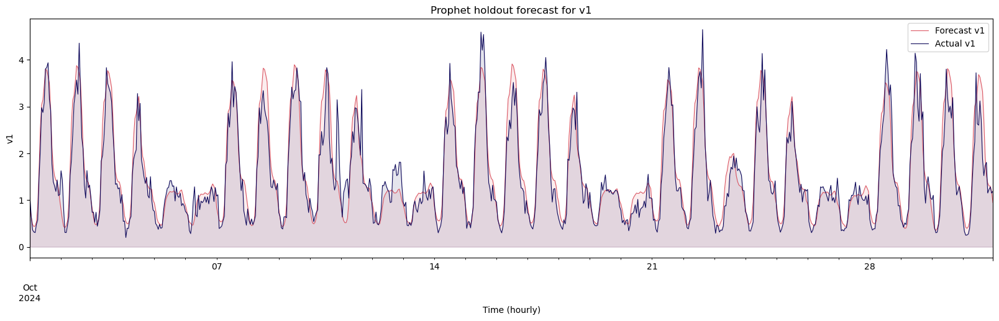

In [13]:
fig, ax = plt.subplots(figsize=(20, 5))
forecast_v1['yhat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v1')
df['v1'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v1')

ax.fill_between(forecast_v1.index, forecast_v1['yhat'], color=color[0], alpha=0.1)
ax.fill_between(df.index, df['v1'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('Prophet holdout forecast for v1')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v1')
plt.show()

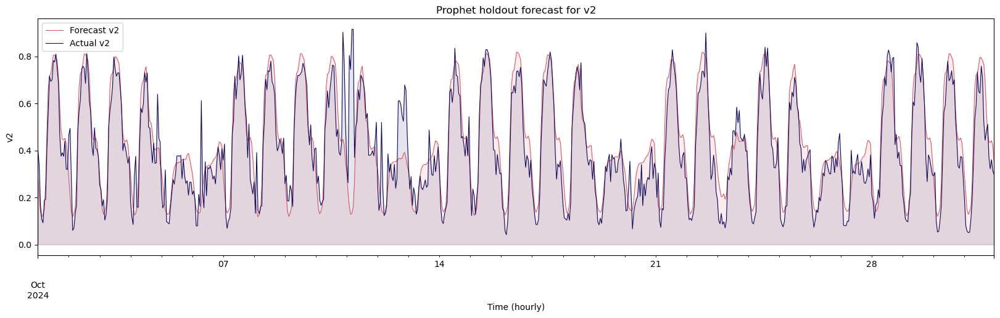

In [14]:
fig, ax = plt.subplots(figsize=(20, 5))
forecast_v2['yhat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v2')
df['v2'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v2')

ax.fill_between(forecast_v2.index, forecast_v2['yhat'], color=color[0], alpha=0.1)
ax.fill_between(df.index, df['v2'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('Prophet holdout forecast for v2')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v2')
plt.show()

As mentioned earlier, Prophet is also a good asset to impute missing values and manage extreme one in our dataset. Thus, I add some new columns which contain the predicted values from the Prophet models if their training value was missing. I will use this variable to train further models.

In [15]:
data_train['proph_v1_pred'] = v1_prophet_model.predict(data_train.rename(columns = {'ts' : 'ds'}))['yhat']
data_train['proph_v2_pred'] = v2_prophet_model.predict(data_train.rename(columns = {'ts' : 'ds'}))['yhat']

data_train['v1_imputed_proph'] = data_train.apply(lambda row: row['proph_v1_pred'] if pd.isna(row['proph_v1']) else row['proph_v1'], axis=1)
data_train['v2_imputed_proph'] = data_train.apply(lambda row: row['proph_v2_pred'] if pd.isna(row['proph_v2']) else row['proph_v2'], axis=1)

data_train['v1_proph_resid'] = data_train['v1_imputed_proph'] - data_train['proph_v1_pred']
data_train['v2_proph_resid'] = data_train['v2_imputed_proph'] - data_train['proph_v2_pred']

# Modeling - OLS

Having the imputed values by the Prophet models, we can now turn our attention towards simple OLS models. For these, I create a function that cross-validates these models the same way as the Prophet cross-validation works. This is needed so that the cross-validated RMSE values are comparable.

In [16]:
def cross_validate_linear_regression(df, formula, horizon, period=None, initial=None, cutoffs=None, disable_tqdm=False):
    """
    Cross-validation for simple Linear Regression models, similar to Prophet's approach.
    
    Parameters
    ----------
    df : pd.DataFrame
        DataFrame containing the time series data.
    formula : str
        Patsy formula specifying the model (e.g., 'y ~ x1 + x2').
    horizon : str
        Forecast horizon (e.g., '5 days').
    period : str, optional
        Time between cutoffs (default is 0.5 * horizon).
    initial : str, optional
        Minimum amount of data for the first training set (default is 3 * horizon).
    cutoffs : list of pd.Timestamp, optional
        Custom cutoffs for cross-validation.
    disable_tqdm : bool, optional
        If True, disables the progress bar.
    
    Returns
    -------
    pd.DataFrame
        DataFrame with actual values, predictions, and cutoffs.
    """
    df = df.copy().reset_index(drop=True)
    horizon = pd.Timedelta(horizon)
    
    if cutoffs is None:
        period = pd.Timedelta(period) if period else 0.5 * horizon
        initial = pd.Timedelta(initial) if initial else 3 * horizon
        cutoffs = generate_cutoffs(df, horizon, initial, period)
    
    # Generate the design matrix for the whole dataset
    y, X = patsy.dmatrices(formula, df, return_type='dataframe')
    
    # Initialize an empty list to store results
    results = []
    
    for cutoff in (tqdm(cutoffs) if not disable_tqdm else cutoffs):
        # Split the data into train and test sets based on the cutoff
        train = df[df['ds'] <= cutoff]
        test = df[(df['ds'] > cutoff) & (df['ds'] <= cutoff + horizon)]
        
        if train.shape[0] < 2:
            raise ValueError("Not enough data before cutoff. Increase initial window.")
        
        # Use the design matrix to get train and test data
        X_train, y_train = X.loc[train.index], y.loc[train.index]
        X_test, y_test = X.loc[test.index], y.loc[test.index]
        
        # Fit the model
        model = LinearRegression()
        model.fit(X_train, y_train.values.ravel())
        
        # Get predictions
        predictions = model.predict(X_test)
        
        # Store the results in a DataFrame
        result_df = pd.DataFrame({
            'ds': test['ds'].values,
            'yhat': predictions,
            'y': y_test.values.ravel(),
            'cutoff': cutoff
        })
        results.append(result_df)
    
    # Return the concatenated results as a DataFrame
    return pd.concat(results, axis=0).reset_index(drop=True)

def generate_cutoffs(df, horizon, initial, period):
    """Generate cutoff timestamps for cross-validation."""
    max_date = df['ds'].max()
    min_date = df['ds'].min() + initial
    cutoffs = []
    
    while max_date - horizon >= min_date:
        cutoffs.append(max_date - horizon)
        max_date -= period
    
    return list(reversed(cutoffs))


I will evaluate 7 different OLS models with increasing complexity, as outlined below. The specifications try to capture more and more seasonal patterns using dummy variables and their interactions. I will use the same specifications for both variables.

In [17]:
ols_formulas = {
    'M1': 'C(month)+C(dow)+C(hour)',
    'M2': 'C(month)+C(dow)+C(hour)+is_holiday',
    'M3': 'C(month)+C(dow)+C(hour)+is_holiday+winter_x_friday+summer_x_friday+winter_x_weekend+summer_x_weekend',
    'M4': 'C(month)+C(dow)+C(hour)+is_holiday+winter_x_friday+summer_x_friday+winter_x_weekend+summer_x_weekend' +\
        '+winter_x_working_hours+summer_x_working_hours',
    'M5': 'C(month)+C(dow)+C(hour)+is_holiday+winter_x_friday+summer_x_friday+winter_x_weekend+summer_x_weekend' +\
        '+winter_x_working_hours+summer_x_working_hours+working_hours_x_friday+working_hours_x_weekend',
    'M6': 'C(month)+C(dow)+C(hour)+is_holiday+winter_x_friday+summer_x_friday+winter_x_weekend+summer_x_weekend' +\
        '+winter_x_working_hours+summer_x_working_hours+working_hours_x_friday+working_hours_x_weekend' +\
        '+working_hours_x_holiday+is_holiweekday+is_holiweekend',
    'M7': 'C(month)*C(dow)+C(month)*C(hour)+C(dow)*C(hour)*is_holiday',
}

Now we can cross-validate the models for `v1`. I use the same set-up as for Prophet.

In [18]:
v1_ols_rmses = {}
for code, formula in ols_formulas.items():
    df_cv = cross_validate_linear_regression(data_train.rename(columns={'ts' : 'ds'}), 'v1_imputed_proph~'+formula, '30 days',
                                             period='122 days', initial='365 days', disable_tqdm=True)
    cutoff_rmses = []
    for c in df_cv.cutoff.unique():
        cutoff_rmses.append(mean_squared_error(df_cv.loc[df_cv['cutoff'] == c, 'y'], df_cv.loc[df_cv['cutoff'] == c, 'yhat'], squared=False))
    v1_ols_rmses[code] = np.mean(cutoff_rmses)

The cross-validated RMSE values suggest that the best-performing model is the most complex one.

In [19]:
v1_ols_rmses

{'M1': 0.6260066352978765,
 'M2': 0.6198314643409015,
 'M3': 0.6252524195710251,
 'M4': 0.6353625858514328,
 'M5': 0.5192100340626061,
 'M6': 0.5108985606672742,
 'M7': 0.5082526381772453}

We can also cross-validate the models for `v2`.

In [20]:
v2_ols_rmses = {}
for code, formula in ols_formulas.items():
    df_cv = cross_validate_linear_regression(data_train.rename(columns={'ts' : 'ds'}), 'v2_imputed_proph~'+formula, '30 days',
                                             period='122 days', initial='365 days', disable_tqdm=True)
    cutoff_rmses = []
    for c in df_cv.cutoff.unique():
        cutoff_rmses.append(mean_squared_error(df_cv.loc[df_cv['cutoff'] == c, 'y'], df_cv.loc[df_cv['cutoff'] == c, 'yhat'], squared=False))
    v2_ols_rmses[code] = np.mean(cutoff_rmses)

Again, the best-performing model seems to be the most complex one.

In [21]:
v2_ols_rmses

{'M1': 0.1251535876038194,
 'M2': 0.12383512083953359,
 'M3': 0.12463470731244215,
 'M4': 0.12549154816105818,
 'M5': 0.10267662859279092,
 'M6': 0.10097300002511837,
 'M7': 0.09647039722814567}

We can now refit the best models on the whole training sample.

In [22]:
X_ols = patsy.dmatrix(ols_formulas['M7'], data=data, return_type='dataframe')
X_ols_train = X_ols.loc[data_train.index]
X_ols_holdout = X_ols.loc[data_holdout.index]

v1_ols_model = LinearRegression().fit(X_ols_train, data_train['v1_imputed_proph'].values.ravel())
v2_ols_model = LinearRegression().fit(X_ols_train, data_train['v2_imputed_proph'].values.ravel())

Having the refitted models, we can calculate the hold-out RMSE values. For both models, it seems that not only are the cross-validated RMSE values lower than the Prophet ones, but this is also true when comparing the hold-out set RMSEs. Thus, out of the Prophet and OLS models, we should choose the Prophet ones.

In [23]:
ols_predictions = pd.DataFrame({
    'ts': data_holdout['ts'],
    'v1' : data_holdout['v1'],
    'v2' :  data_holdout['v2'],
    'v1_hat': v1_ols_model.predict(X_ols_holdout),
    'v2_hat': v2_ols_model.predict(X_ols_holdout)
})

ols_results = {
    'v1 CV RMSE' : v1_ols_rmses['M7'],
    'v1 holdout RMSE' : mean_squared_error(ols_predictions['v1'], ols_predictions['v1_hat'], squared=False),
    'v2 CV RMSE' : v2_ols_rmses['M7'],
    'v2 holdout RMSE' : mean_squared_error(ols_predictions['v2'], ols_predictions['v2_hat'], squared=False)
}

In [24]:
print('Best OLS model for v1:')
print(f'    CV RMSE: {ols_results['v1 CV RMSE']:.4f} ({ols_results['v1 CV RMSE'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {ols_results['v1 holdout RMSE']:.4f} ({ols_results['v1 holdout RMSE'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('\nBest OLS model for v2:')
print(f'    CV RMSE: {ols_results['v2 CV RMSE']:.4f} ({ols_results['v2 CV RMSE'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {ols_results['v2 holdout RMSE']:.4f} ({ols_results['v2 holdout RMSE'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

Best OLS model for v1:
    CV RMSE: 0.5083 (38.11% of mean)
    Hold-out RMSE: 0.3934 (26.20% of mean)

Best OLS model for v2:
    CV RMSE: 0.0965 (25.63% of mean)
    Hold-out RMSE: 0.1097 (27.24% of mean)


Just out of curiosity, we can also plot the hold-out predictions for the OLS models. Visually, these are rather similar to the Prophet forecasts, but we should trust the RMSE values, not just simple visual observations.

In [25]:
ols_predictions.set_index('ts', inplace=True)

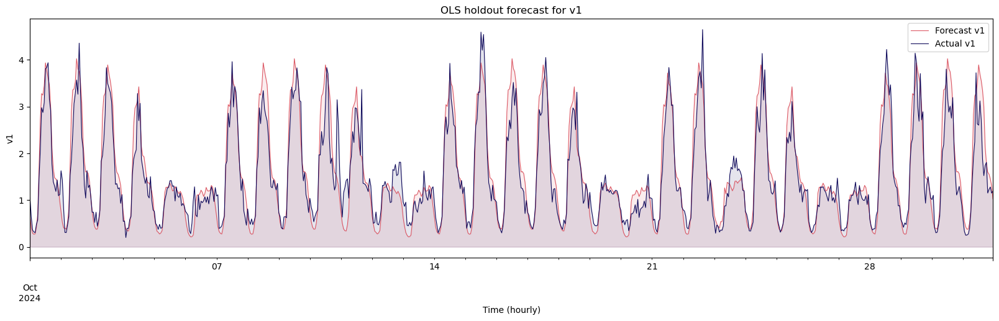

In [26]:
fig, ax = plt.subplots(figsize=(20, 5))
ols_predictions['v1_hat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v1')
ols_predictions['v1'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v1')

ax.fill_between(ols_predictions.index, ols_predictions['v1_hat'], color=color[0], alpha=0.1)
ax.fill_between(ols_predictions.index, ols_predictions['v1'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('OLS holdout forecast for v1')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v1')
plt.show()

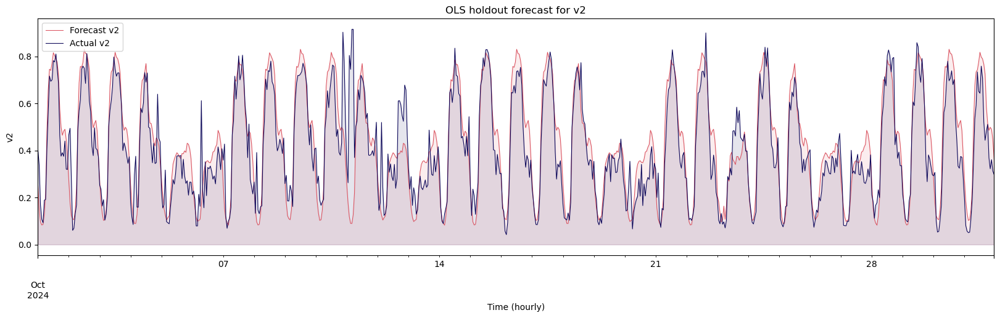

In [27]:
fig, ax = plt.subplots(figsize=(20, 5))
ols_predictions['v2_hat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v2')
ols_predictions['v2'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v2')

ax.fill_between(ols_predictions.index, ols_predictions['v2_hat'], color=color[0], alpha=0.1)
ax.fill_between(ols_predictions.index, ols_predictions['v2'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('OLS holdout forecast for v2')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v2')
plt.show()

# Modeling - XGBoost

As discussed earlier, there is no point in building ARIMA models, as we will have to forecast for a rather long Therefore, the third model I will build will be an XGBoost (but I will later also examine VAR models). I have chosen this model as during my previous home assignments, it always turned out to be among the best performing models - thus I wanted to see how it works on time series.

Similary to what I have done for the OLS models, I define a cross-validation function based on the logic of the Prophet package.

In [28]:
def cross_validate_xgboost(df, target, vars, horizon, xgb_params, period=None, initial=None, cutoffs=None, disable_tqdm=False):
    """
    Performs time series cross-validation for an XGBoost model.

    Parameters:
    -----------
    df : pandas.DataFrame
        A DataFrame containing time series data with a datetime column named 'ds'.
    
    target : str
        The name of the target variable in `df` to be predicted.
    
    vars : list of str
        A list of feature column names used as predictors.
    
    horizon : str or pandas.Timedelta
        The forecast horizon, specifying how far ahead predictions are made (e.g., '30 days').
    
    xgb_params : dict
        A dictionary of hyperparameters to be passed to the XGBoost model.
    
    period : str or pandas.Timedelta, optional
        The spacing between successive cutoff points. If not provided, defaults to half of the horizon.
    
    initial : str or pandas.Timedelta, optional
        The length of the initial training period. If not provided, defaults to three times the horizon.
    
    cutoffs : list of timestamps, optional
        A predefined list of cutoff dates for cross-validation. If None, cutoffs are automatically generated.
    
    disable_tqdm : bool, default=False
        If True, disables the progress bar when iterating over cutoffs.

    Returns:
    --------
    pandas.DataFrame
        A DataFrame containing:
        - 'ds' (datetime): The timestamps of the test set observations.
        - 'yhat' (float): The predicted values.
        - 'y' (float): The actual values.
        - 'cutoff' (datetime): The cutoff date used for training.

    Notes:
    ------
    - The function splits data into training and test sets based on cutoff dates.
    - The XGBoost model is trained on observations before each cutoff and tested on the subsequent `horizon`.
    - The 'hist' tree method is used for efficiency, and the model runs with all available CPU cores (`n_jobs=-1`).
    - If the initial training window is too small, a `ValueError` is raised.
    """
    df = df.copy().reset_index(drop=True)
    horizon = pd.Timedelta(horizon)
    
    if cutoffs is None:
        period = pd.Timedelta(period) if period else 0.5 * horizon
        initial = pd.Timedelta(initial) if initial else 3 * horizon
        cutoffs = generate_cutoffs(df, horizon, initial, period)
    
    
    y, X = df[target], df[vars]
    
    # Initialize an empty list to store results
    results = []
    
    for cutoff in (tqdm(cutoffs) if not disable_tqdm else cutoffs):
        # Split the data into train and test sets based on the cutoff
        train = df[df['ds'] <= cutoff]
        test = df[(df['ds'] > cutoff) & (df['ds'] <= cutoff + horizon)]
        
        if train.shape[0] < 2:
            raise ValueError("Not enough data before cutoff. Increase initial window.")
        
        # Use the design matrix to get train and test data
        X_train, y_train = X.loc[train.index], y.loc[train.index]
        X_test, y_test = X.loc[test.index], y.loc[test.index]
        
        # Fit the model
        model = XGBRegressor(
            n_jobs=-1,
            random_state = 42,
            tree_method='hist', 
            objective='reg:squarederror',
            **xgb_params
        )
        model.fit(X_train, y_train)
        
        # Get predictions
        predictions = model.predict(X_test)
        
        # Store the results in a DataFrame
        result_df = pd.DataFrame({
            'ds': test['ds'].values,
            'yhat': predictions,
            'y': y_test.values.ravel(),
            'cutoff': cutoff
        })
        results.append(result_df)
    
    # Return the concatenated results as a DataFrame
    return pd.concat(results, axis=0).reset_index(drop=True)

As we have seen previously, there are 4 important seasonalities in both time series: by month, by day of the week, by hour and by holidays. Thus, I will include dummies for these features in my XGBoost model, and XGBoost may be able to find the best interactions among them automatically.

In [29]:
xgb_vars = [var for var in data_train.columns if var.startswith('month_') or var.startswith('dow_') or var.startswith('hour_') or var == 'is_holiday']

# Checkpoint 4: Run until next checkpoint only if retraining XGBoost models.

I define a rather large training grid for the model.

In [30]:
xgb_grid = {
    "n_estimators": [50, 100],
    "learning_rate": [0.05, 0.1], 
    "max_depth": [8, 10],
    "subsample": [0.8, 1],
    "colsample_bytree": [0.9, 1],
    "gamma": [0.1, 0.2],
    "min_child_weight": [3, 5],
    "lambda": [1, 3, 5],
    "alpha": [0, 0.1, 1],
}
xgb_all_params = [dict(zip(xgb_grid.keys(), v)) for v in itertools.product(*xgb_grid.values())]

I also define another function which calculates the cross-validated RMSE for a given set of parameters.

In [31]:
def eval_xgboost(df, params, target, vars):
    """
    Evaluates an XGBoost model using time series cross-validation and returns the average RMSE.

    Parameters:
    -----------
    df : pandas.DataFrame
        A DataFrame containing time series data with a datetime column named 'ds'.
    
    params : dict
        A dictionary of hyperparameters to be passed to the XGBoost model.
    
    target : str
        The name of the target variable in `df` to be predicted.
    
    vars : list of str
        A list of feature column names used as predictors.

    Returns:
    --------
    float
        The mean root mean squared error (RMSE) across all cross-validation cutoffs.

    Notes:
    ------
    - Uses `cross_validate_xgboost` with a 30-day forecast horizon, a 122-day period between cutoffs, 
      and an initial training window of 365 days.
    - RMSE is computed for each cutoff and averaged across all cutoffs.
    - The progress bar is disabled for efficiency.
    """
    df_cv = cross_validate_xgboost(df, target, vars, '30 days', params, period='122 days', initial='365 days', disable_tqdm=True)
    cutoff_rmses = []
    for c in df_cv.cutoff.unique():
        cutoff_rmses.append(mean_squared_error(df_cv.loc[df_cv['cutoff'] == c, 'y'], df_cv.loc[df_cv['cutoff'] == c, 'yhat'], squared=False))
    return np.mean(cutoff_rmses)

I then use this function in parallel processing to evaluate the whole parameter grid. This code should take around 6 minutes to run.

In [32]:
xgb_rmses = Parallel(n_jobs=7, verbose=0)(delayed(eval_xgboost)(data_train.rename(columns={'ts' : 'ds'}), params, 'v1_imputed_proph', xgb_vars) for params in xgb_all_params)
xgb_v1_tuning_results = pd.DataFrame(xgb_all_params)
xgb_v1_tuning_results['rmse'] = xgb_rmses

I save the tuning results.

In [33]:
xgb_v1_tuning_results.to_pickle('xgb_v1_tuning_results.pkl')

And I repeat the tuning for `v2` as well. This also takes around 6 minutes.

In [34]:
xgb_rmses = Parallel(n_jobs=7, verbose=0)(delayed(eval_xgboost)(data_train.rename(columns={'ts' : 'ds'}), params, 'v2_imputed_proph', xgb_vars) for params in xgb_all_params)
xgb_v2_tuning_results = pd.DataFrame(xgb_all_params)
xgb_v2_tuning_results['rmse'] = xgb_rmses

I also save the results.

In [35]:
xgb_v2_tuning_results.to_pickle('xgb_v2_tuning_results.pkl')

# Checkpoint 5: Run from here for saved XGBoost tuning results.

Importing the saved tuning results and getting the best parameters.

In [30]:
xgb_v1_tuning_results = pd.read_pickle('xgb_v1_tuning_results.pkl')
xgb_v2_tuning_results = pd.read_pickle('xgb_v2_tuning_results.pkl')

In [31]:
xgb_v1_best_params = xgb_v1_tuning_results.loc[xgb_v1_tuning_results['rmse'].idxmin()]
xgb_v2_best_params = xgb_v2_tuning_results.loc[xgb_v2_tuning_results['rmse'].idxmin()]

Now we can re-train the XGBoost models on the whole training sample using the best hyperparameters.

In [32]:
xgb_v1_model = XGBRegressor(
    n_jobs=-1,
    random_state = 42,
    tree_method='hist', 
    objective='reg:squarederror',
    n_estimators=int(xgb_v1_best_params.iloc[:-1].to_dict()['n_estimators']),
    learning_rate=xgb_v1_best_params.iloc[:-1].to_dict()['learning_rate'],
    max_depth=int(xgb_v1_best_params.iloc[:-1].to_dict()['max_depth']),
    subsample=xgb_v1_best_params.iloc[:-1].to_dict()['subsample'],
    colsample_bytree=xgb_v1_best_params.iloc[:-1].to_dict()['colsample_bytree'],
    gamma=xgb_v1_best_params.iloc[:-1].to_dict()['gamma'],
    min_child_weight=int(xgb_v1_best_params.iloc[:-1].to_dict()['min_child_weight']),
    reg_lambda=xgb_v1_best_params.iloc[:-1].to_dict()['lambda'],
    reg_alpha=xgb_v1_best_params.iloc[:-1].to_dict()['alpha']
)

xgb_v1_model.fit(data_train[xgb_vars], data_train['v1_imputed_proph'])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=8, max_leaves=None,
             min_child_weight=3, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=-1,
             num_parallel_tree=None, random_state=42, ...)

In [33]:
xgb_v2_model = XGBRegressor(
    n_jobs=-1,
    random_state = 42,
    tree_method='hist', 
    objective='reg:squarederror',
    n_estimators=int(xgb_v2_best_params.iloc[:-1].to_dict()['n_estimators']),
    learning_rate=xgb_v2_best_params.iloc[:-1].to_dict()['learning_rate'],
    max_depth=int(xgb_v2_best_params.iloc[:-1].to_dict()['max_depth']),
    subsample=xgb_v2_best_params.iloc[:-1].to_dict()['subsample'],
    colsample_bytree=xgb_v2_best_params.iloc[:-1].to_dict()['colsample_bytree'],
    gamma=xgb_v2_best_params.iloc[:-1].to_dict()['gamma'],
    min_child_weight=int(xgb_v2_best_params.iloc[:-1].to_dict()['min_child_weight']),
    reg_lambda=xgb_v2_best_params.iloc[:-1].to_dict()['lambda'],
    reg_alpha=xgb_v2_best_params.iloc[:-1].to_dict()['alpha']
)

xgb_v2_model.fit(data_train[xgb_vars], data_train['v2_imputed_proph'])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.9, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.1, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.05, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=5, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=100, n_jobs=-1,
             num_parallel_tree=None, random_state=42, ...)

The next step is to report the CV and the hold-out RMSE values. It turns out, that for both variables, the XGBoost models perform slightly better than the Prophet ones both during cross-validation and on the hold-out set.

In [34]:
xgb_holdout_rmse_dict = {
    'xgb_v1' : -1,
    'xgb_v2' : -1
}
df = data_holdout.rename(columns={'ts': 'ds'})
xgb_forecast_v1 = xgb_v1_model.predict(df[xgb_vars])
xgb_holdout_rmse_dict['xgb_v1'] = mean_squared_error(df['v1'], xgb_forecast_v1, squared=False)

df = data_holdout.rename(columns={'ts': 'ds'})
xgb_forecast_v2 = xgb_v2_model.predict(df[xgb_vars])
xgb_holdout_rmse_dict['xgb_v2'] = mean_squared_error(df['v2'], xgb_forecast_v2, squared=False)
print('Best XGB model for v1:')
print(f'    CV RMSE: {xgb_v1_best_params['rmse']:.4f} ({xgb_v1_best_params['rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {xgb_holdout_rmse_dict['xgb_v1']:.4f} ({xgb_holdout_rmse_dict['xgb_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('\nBest XGB model for v2:')
print(f'    CV RMSE: {xgb_v2_best_params['rmse']:.4f} ({xgb_v2_best_params['rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {xgb_holdout_rmse_dict['xgb_v2']:.4f} ({xgb_holdout_rmse_dict['xgb_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

Best XGB model for v1:
    CV RMSE: 0.4676 (35.06% of mean)
    Hold-out RMSE: 0.3379 (22.51% of mean)

Best XGB model for v2:
    CV RMSE: 0.0910 (24.19% of mean)
    Hold-out RMSE: 0.1011 (25.11% of mean)


Plotting the hold-out set forecasts, we can see similar patterns as earlier. The models generally correctly identify the seasonal patterns, put cannot capture the *weird* stuff that has happened around 13 October. 

In [35]:
xgb_predictions = pd.DataFrame({
    'ts': data_holdout['ts'],
    'v1' : data_holdout['v1'],
    'v2' :  data_holdout['v2'],
    'v1_hat': xgb_forecast_v1,
    'v2_hat': xgb_forecast_v2
})

xgb_predictions.set_index('ts', inplace=True)

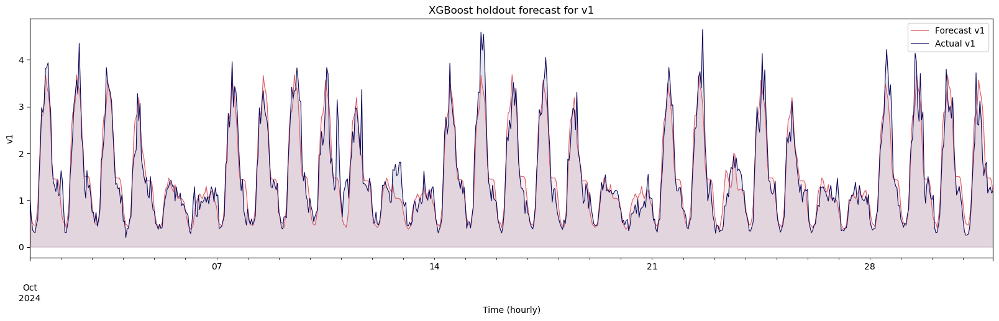

In [36]:
fig, ax = plt.subplots(figsize=(20, 5))
xgb_predictions['v1_hat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v1')
xgb_predictions['v1'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v1')

ax.fill_between(xgb_predictions.index, xgb_predictions['v1_hat'], color=color[0], alpha=0.1)
ax.fill_between(xgb_predictions.index, xgb_predictions['v1'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('XGBoost holdout forecast for v1')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v1')
plt.show()

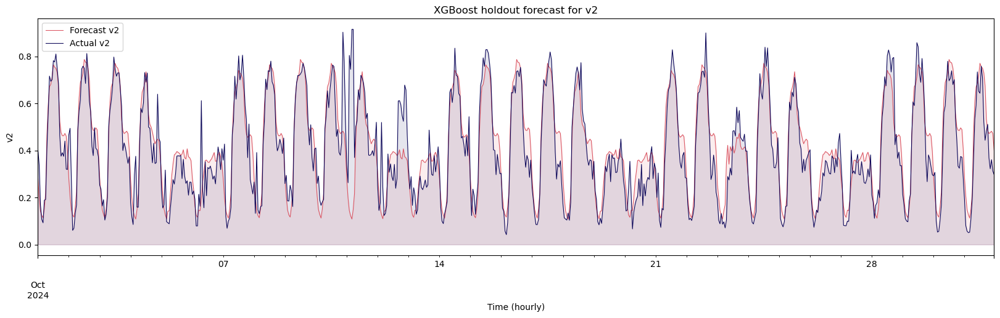

In [37]:
fig, ax = plt.subplots(figsize=(20, 5))
xgb_predictions['v2_hat'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v2')
xgb_predictions['v2'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v2')

ax.fill_between(xgb_predictions.index, xgb_predictions['v2_hat'], color=color[0], alpha=0.1)
ax.fill_between(xgb_predictions.index, xgb_predictions['v2'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('XGBoost holdout forecast for v2')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v2')
plt.show()

In [38]:
data_train['xgb_v1_pred'] = xgb_v1_model.predict(data_train[xgb_vars])
data_train['xgb_v2_pred'] = xgb_v2_model.predict(data_train[xgb_vars])

data_train['v1_xgb_resid'] = data_train['v1_imputed_proph'] - data_train['xgb_v1_pred']
data_train['v2_xgb_resid'] = data_train['v2_imputed_proph'] - data_train['xgb_v2_pred']

# Modeling - VAR

As noted at the beginning, the residuals of the models (that effectively filter out seasonal patterns) still show Granger-causality patterns, thus we might want to experiment with VAR models. To do so, I cross-validate the number of lags in the VAR models (corresponding to seasonal patterns) and the best variables to use for VAR modeling (simple imputed ones, or residuals from either Prophet or XGBoost).

# Checkpoint 6: Run until next checkpoint only if retraining VAR models.

I define the VAR parameter grid.

In [68]:
var_params = {
    'maxlags': [24, 24*7, 24*30],
    'var_list' : [['v1_proph_resid', 'v2_proph_resid'],
                  ['v1_xgb_resid', 'v2_xgb_resid'],
                  ['v1_imputed_proph', 'v2_imputed_proph']]
}

var_param_list = [dict(zip(var_params.keys(), v)) for v in itertools.product(*var_params.values())]

I define a function to cross-validate VAR models with a Prophet-like interface. This is a bit tricky, as we cannot use the previously calculated residuals (as those are from models built on the whole training set). So, we have to train XGBoost and Prophet models for each CV-fold again. This is because we want to simulate the real prediction set up, where we only now the information up until a certain point.

In [ ]:
def cross_validate_var(df, horizon, params, period=None, initial=None, cutoffs=None, disable_tqdm=False):
    """
    Perform cross-validation for a Vector Autoregression (VAR) model with different background model adjustments.

    Parameters:
    df : pd.DataFrame
        Time series dataframe containing columns 'ds' (timestamps) and relevant target variables.
    horizon : str or pd.Timedelta
        Forecasting horizon specifying the number of steps ahead to predict.
    params : dict
        Dictionary of model parameters including:
        - 'var_list': List of variables used in VAR model (e.g., ['v1_xgb_resid', 'v2_xgb_resid']).
        - 'maxlags': Maximum lag order for the VAR model.
    period : str or pd.Timedelta, optional
        Step size for moving cutoffs. Defaults to 0.5 * horizon.
    initial : str or pd.Timedelta, optional
        Minimum initial training window size. Defaults to 3 * horizon.
    cutoffs : list of timestamps, optional
        Predefined cutoff points for cross-validation. If None, they are generated based on period and initial.
    disable_tqdm : bool, optional
        Whether to disable progress bar for cutoffs iteration. Default is False.

    Returns:
    pd.DataFrame
        DataFrame containing forecasted values ('v1hat', 'v2hat'), actual values ('v1', 'v2'), and cutoff timestamps.

    Raises:
    ValueError
        If there is insufficient data before a cutoff for model training.

    Notes:
    - If `params['var_list']` includes residuals (e.g., 'v1_xgb_resid'), it fits an XGBoost or Prophet model first to remove seasonal patterns.
    - Background model forecasts (XGBoost/Prophet) are added back to VAR residual forecasts for final predictions.
    - The function supports both XGBoost-based and Prophet-based residual extraction before fitting VAR.
    """

    df = df.copy().reset_index(drop=True)
    horizon = pd.Timedelta(horizon)
    
    if cutoffs is None:
        period = pd.Timedelta(period) if period else 0.5 * horizon
        initial = pd.Timedelta(initial) if initial else 3 * horizon
        cutoffs = generate_cutoffs(df, horizon, initial, period)
    
    # Initialize an empty list to store results
    results = []
    
    for cutoff in (tqdm(cutoffs) if not disable_tqdm else cutoffs):
        # Split the data into train and test sets based on the cutoff
        train = df[df['ds'] <= cutoff]
        test = df[(df['ds'] > cutoff) & (df['ds'] <= cutoff + horizon)]
        
        if train.shape[0] < 2:
            raise ValueError("Not enough data before cutoff. Increase initial window.")
        
        # Fit background models to get residuals
        if params['var_list'] == ['v1_xgb_resid', 'v2_xgb_resid']:
            xgb_model1 = XGBRegressor(
                n_jobs=-1,
                random_state = 42,
                tree_method='hist',
                objective='reg:squarederror',
                n_estimators=int(xgb_v1_best_params.iloc[:-1].to_dict()['n_estimators']),
                learning_rate=xgb_v1_best_params.iloc[:-1].to_dict()['learning_rate'],
                max_depth=int(xgb_v1_best_params.iloc[:-1].to_dict()['max_depth']),
                subsample=xgb_v1_best_params.iloc[:-1].to_dict()['subsample'],
                colsample_bytree=xgb_v1_best_params.iloc[:-1].to_dict()['colsample_bytree'],
                gamma=xgb_v1_best_params.iloc[:-1].to_dict()['gamma'],
                min_child_weight=int(xgb_v1_best_params.iloc[:-1].to_dict()['min_child_weight']),
                reg_lambda=xgb_v1_best_params.iloc[:-1].to_dict()['lambda'],
                reg_alpha=xgb_v1_best_params.iloc[:-1].to_dict()['alpha']
            )

            xgb_model1.fit(train[xgb_vars], train['v1_imputed_proph'])
            
            xgb_model2 = XGBRegressor(
                n_jobs=-1,
                random_state = 42,
                tree_method='hist',
                objective='reg:squarederror',
                n_estimators=int(xgb_v2_best_params.iloc[:-1].to_dict()['n_estimators']),
                learning_rate=xgb_v2_best_params.iloc[:-1].to_dict()['learning_rate'],
                max_depth=int(xgb_v2_best_params.iloc[:-1].to_dict()['max_depth']),
                subsample=xgb_v2_best_params.iloc[:-1].to_dict()['subsample'],
                colsample_bytree=xgb_v2_best_params.iloc[:-1].to_dict()['colsample_bytree'],
                gamma=xgb_v2_best_params.iloc[:-1].to_dict()['gamma'],
                min_child_weight=int(xgb_v2_best_params.iloc[:-1].to_dict()['min_child_weight']),
                reg_lambda=xgb_v2_best_params.iloc[:-1].to_dict()['lambda'],
                reg_alpha=xgb_v2_best_params.iloc[:-1].to_dict()['alpha']
            )

            xgb_model2.fit(train[xgb_vars], train['v2_imputed_proph'])

            train['v1_xgb_resid'] = train['v1_imputed_proph'].values - xgb_model1.predict(train[xgb_vars])
            train['v2_xgb_resid'] = train['v2_imputed_proph'].values - xgb_model2.predict(train[xgb_vars])
            test['xgb_v1_pred'] = xgb_model1.predict(test[xgb_vars])
            test['xgb_v2_pred'] = xgb_model2.predict(test[xgb_vars])

        elif params['var_list'] == ['v1_proph_resid', 'v2_proph_resid']:
            proph_model1 = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=False,
                daily_seasonality=False,
                growth='flat',
                seasonality_mode='additive',
                **v1_best_params.iloc[:-4].to_dict()
            ).add_country_holidays(country_name='HU')

            for cond_season in v1_best_params['complexity']:
                proph_model1.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v1_best_params['fourier_order'], condition_name=cond_season['condition_name'])
            
            proph_model1.fit(train.rename(columns={'v1_imputed_proph': 'y'}))

            proph_model2 = Prophet(
                yearly_seasonality=True,
                weekly_seasonality=False,
                daily_seasonality=False,
                growth='flat',
                seasonality_mode='additive',
                **v2_best_params.iloc[:-4].to_dict()
            ).add_country_holidays(country_name='HU')

            for cond_season in v2_best_params['complexity']:
                proph_model2.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v2_best_params['fourier_order'], condition_name=cond_season['condition_name'])
            
            proph_model2.fit(train.rename(columns={'v2_imputed_proph': 'y'}))

            train['v1_proph_resid'] = train['v1_imputed_proph'].values - proph_model1.predict(train)['yhat'].values
            train['v2_proph_resid'] = train['v2_imputed_proph'].values - proph_model2.predict(train)['yhat'].values
            test['proph_v1_pred'] = proph_model1.predict(test)['yhat'].values
            test['proph_v2_pred'] = proph_model2.predict(test)['yhat'].values
        
        # Fit the VAR model
        model = VAR(train[params['var_list']]).fit(maxlags = params['maxlags'], trend = 'c')
        
        # Get predictions
        predictions = model.forecast(train[params['var_list']].values[-model.k_ar :], steps = test.shape[0])
        
        # Store the results in a DataFrame
        result_df = pd.DataFrame({
            'ds': test['ds'].values,
            'v1hat': predictions[:,0],
            'v2hat': predictions[:,1],
            'v1': test['v1_imputed_proph'].values,
            'v2': test['v2_imputed_proph'].values,
            'cutoff': cutoff
        })

        # Add back background model predictions if VAR is based on residuals
        if params['var_list'] == ['v1_xgb_resid', 'v2_xgb_resid']:
            result_df['v1hat'] = result_df['v1hat'].values + test['xgb_v1_pred'].values
            result_df['v2hat'] = result_df['v2hat'].values + test['xgb_v2_pred'].values
        elif params['var_list'] == ['v1_proph_resid', 'v2_proph_resid']:
            result_df['v1hat'] = result_df['v1hat'].values + test['proph_v1_pred'].values
            result_df['v2hat'] = result_df['v2hat'].values + test['proph_v2_pred'].values

        results.append(result_df)
    
    # Return the concatenated results as a DataFrame
    return pd.concat(results, axis=0).reset_index(drop=True)

Now we can run the cross-validation.

In [70]:
logging.getLogger('cmdstanpy').disabled = True
logging.getLogger('prophet').disabled = True

v1_var_rmses = []
v2_var_rmses = []
for params in var_param_list:
    df_cv = cross_validate_var(data_train.rename(columns={'ts' : 'ds'}), '30 days', params, period='122 days', initial='365 days', disable_tqdm=True)
    v1_cutoff_rmses = []
    v2_cutoff_rmses = []
    for c in df_cv.cutoff.unique():
        v1_cutoff_rmses.append(mean_squared_error(df_cv.loc[df_cv['cutoff'] == c, 'v1'], df_cv.loc[df_cv['cutoff'] == c, 'v1hat'], squared=False))
        v2_cutoff_rmses.append(mean_squared_error(df_cv.loc[df_cv['cutoff'] == c, 'v2'], df_cv.loc[df_cv['cutoff'] == c, 'v2hat'], squared=False))
    v1_var_rmses.append(np.mean(v1_cutoff_rmses))
    v2_var_rmses.append(np.mean(v2_cutoff_rmses))

var_results = pd.DataFrame(var_param_list)
var_results['v1_rmse'] = v1_var_rmses
var_results['v2_rmse'] = v2_var_rmses

logging.getLogger('cmdstanpy').disabled = False
logging.getLogger('prophet').disabled = False

And save the results.

In [72]:
var_results.to_pickle('var_results.pkl')

# Checkpoint 7: Run from here for saved VAR results

Importing the saved VAR CV results.

In [73]:
var_results = pd.read_pickle('var_results.pkl')

Identifying the best VAR parameters.

In [74]:
best_v1_var_params = var_results.loc[var_results['v1_rmse'].idxmin()]
best_v2_var_params = var_results.loc[var_results['v2_rmse'].idxmin()]

In [75]:
best_v1_var_params

maxlags                                  720
var_list    [v1_proph_resid, v2_proph_resid]
v1_rmse                             0.442047
v2_rmse                             0.090641
Name: 6, dtype: object

In [76]:
best_v2_var_params

maxlags                                  720
var_list    [v1_proph_resid, v2_proph_resid]
v1_rmse                             0.442047
v2_rmse                             0.090641
Name: 6, dtype: object

And refitting the VAR models on the whole training set. Note that as the best parameters for the variables are the same, this could have been done with one VAR model only.

In [139]:
v1_var_model = VAR(data_train[best_v1_var_params['var_list']]).fit(maxlags = best_v1_var_params['maxlags'], trend = 'c')
v2_var_model = VAR(data_train[best_v2_var_params['var_list']]).fit(maxlags = best_v2_var_params['maxlags'], trend = 'c')

Now we can calculate the holdout-set RMSE values for the VAR models.

In [140]:
var_holdout = pd.DataFrame({
    'ds': data_holdout['ts'],
    'v1': data_holdout['v1'],
    'v2': data_holdout['v2'],
    'v1_pred' : (v1_var_model.forecast(data_train[best_v1_var_params['var_list']].values[-v1_var_model.k_ar :],
                                       steps = data_holdout.shape[0])[:,0]
                    + v1_prophet_model.predict(data_holdout.rename(columns={'ts': 'ds'}))['yhat'].values),
    'v2_pred' : (v2_var_model.forecast(data_train[best_v2_var_params['var_list']].values[-v2_var_model.k_ar :],
                                       steps = data_holdout.shape[0])[:,1]
                    + v2_prophet_model.predict(data_holdout.rename(columns={'ts': 'ds'}))['yhat'].values)
})

In [141]:
var_holdout_rmse_dict = {
    'var_v1' : mean_squared_error(var_holdout['v1'], var_holdout['v1_pred'], squared=False),
    'var_v2' : mean_squared_error(var_holdout['v2'], var_holdout['v2_pred'], squared=False)
}

It turns out that this is our best-performing model, both in terms of cross-validated and holdout-set RMSE.

In [142]:
print('Best VAR model for v1:')
print(f'    CV RMSE: {best_v1_var_params['v1_rmse']:.4f} ({best_v1_var_params['v1_rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {var_holdout_rmse_dict['var_v1']:.4f} ({var_holdout_rmse_dict['var_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('Best VAR model for v2:')
print(f'    CV RMSE: {best_v2_var_params['v2_rmse']:.4f} ({best_v2_var_params['v2_rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {var_holdout_rmse_dict['var_v2']:.4f} ({var_holdout_rmse_dict['var_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

Best VAR model for v1:
    CV RMSE: 0.4420 (33.14% of mean)
    Hold-out RMSE: 0.3280 (21.84% of mean)
Best VAR model for v2:
    CV RMSE: 0.0906 (24.08% of mean)
    Hold-out RMSE: 0.0986 (24.48% of mean)


In [143]:
var_holdout.set_index('ds', inplace=True)

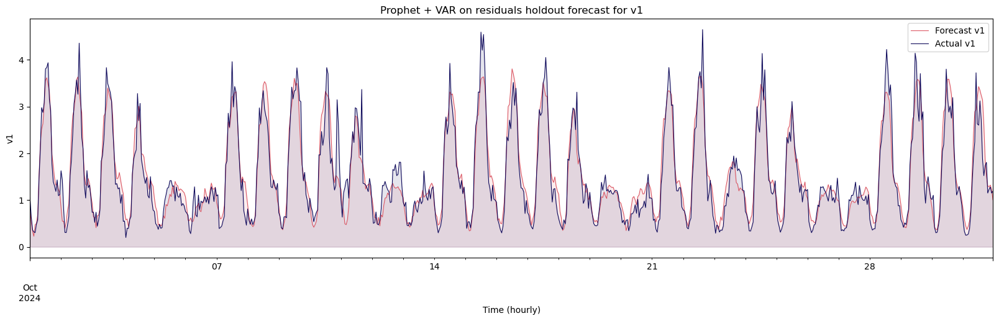

In [144]:
fig, ax = plt.subplots(figsize=(20, 5))
var_holdout['v1_pred'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v1')
var_holdout['v1'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v1')

ax.fill_between(var_holdout.index, var_holdout['v1_pred'], color=color[0], alpha=0.1)
ax.fill_between(var_holdout.index, var_holdout['v1'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('Prophet + VAR on residuals holdout forecast for v1')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v1')
plt.show()

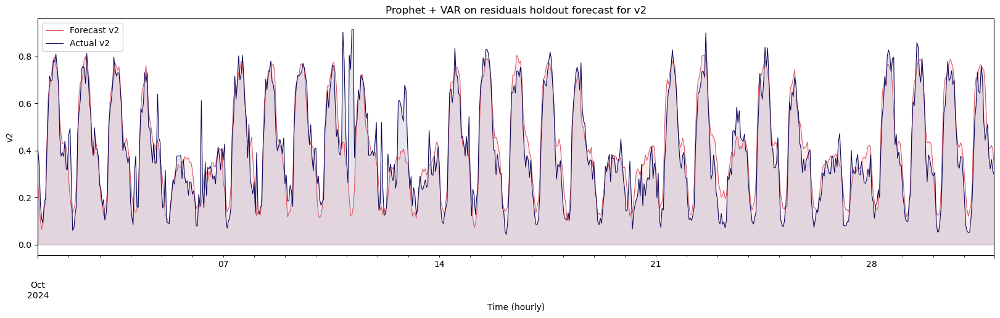

In [145]:
fig, ax = plt.subplots(figsize=(20, 5))
var_holdout['v2_pred'].plot(ax=ax, color=color[0], linewidth=0.75, label='Forecast v2')
var_holdout['v2'].plot(ax=ax, color=color[1], linewidth=0.75, label='Actual v2')

ax.fill_between(var_holdout.index, var_holdout['v2_pred'], color=color[0], alpha=0.1)
ax.fill_between(var_holdout.index, var_holdout['v2'], color=color[1], alpha=0.1)
ax.legend()
ax.set_title('Prophet + VAR on residuals holdout forecast for v2')
ax.set_xlabel('Time (hourly)')
ax.set_ylabel('v2')
plt.show()

# Forecasting for live data

Now let's take a look at all the calculated RMSE values. First, note that there are only minor differences between the set-ups. Second, however, it seems that the VAR models have a very slight overall edge compared to the simple Prophet, OLS and XGBoost models, in terms of both variables. This is true both for the cross-validated RMSE values, as well as for the hold-out set RMSE values.

Therefore, I will perform the final prediction using the VAR models (that were built on the residuals of the Prophet models).

In [146]:
print('Best Prophet model for v1:')
print(f'    CV RMSE: {v1_best_params['rmse']:.4f} ({v1_best_params['rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {holdout_rmse_dict['prophet_v1']:.4f} ({holdout_rmse_dict['prophet_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('Best Prophet model for v2:')
print(f'    CV RMSE: {v2_best_params['rmse']:.4f} ({v2_best_params['rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {holdout_rmse_dict['prophet_v2']:.4f} ({holdout_rmse_dict['prophet_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

print('\n\nBest OLS model for v1:')
print(f'    CV RMSE: {ols_results['v1 CV RMSE']:.4f} ({ols_results['v1 CV RMSE'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {ols_results['v1 holdout RMSE']:.4f} ({ols_results['v1 holdout RMSE'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('Best OLS model for v2:')
print(f'    CV RMSE: {ols_results['v2 CV RMSE']:.4f} ({ols_results['v2 CV RMSE'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {ols_results['v2 holdout RMSE']:.4f} ({ols_results['v2 holdout RMSE'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

print('\n\nBest XGB model for v1:')
print(f'    CV RMSE: {xgb_v1_best_params['rmse']:.4f} ({xgb_v1_best_params['rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {xgb_holdout_rmse_dict['xgb_v1']:.4f} ({xgb_holdout_rmse_dict['xgb_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('Best XGB model for v2:')
print(f'    CV RMSE: {xgb_v2_best_params['rmse']:.4f} ({xgb_v2_best_params['rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {xgb_holdout_rmse_dict['xgb_v2']:.4f} ({xgb_holdout_rmse_dict['xgb_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

print('\n\nBest VAR model for v1:')
print(f'    CV RMSE: {best_v1_var_params['v1_rmse']:.4f} ({best_v1_var_params['v1_rmse'] / data_train.proph_v1.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {var_holdout_rmse_dict['var_v1']:.4f} ({var_holdout_rmse_dict['var_v1'] / data_holdout.v1.mean() * 100:.2f}% of mean)')
print('Best VAR model for v2:')
print(f'    CV RMSE: {best_v2_var_params['v2_rmse']:.4f} ({best_v2_var_params['v2_rmse'] / data_train.proph_v2.mean() * 100:.2f}% of mean)')
print(f'    Hold-out RMSE: {var_holdout_rmse_dict['var_v2']:.4f} ({var_holdout_rmse_dict['var_v2'] / data_holdout.v2.mean() * 100:.2f}% of mean)')

Best Prophet model for v1:
    CV RMSE: 0.4786 (35.89% of mean)
    Hold-out RMSE: 0.3508 (23.37% of mean)
Best Prophet model for v2:
    CV RMSE: 0.0933 (24.80% of mean)
    Hold-out RMSE: 0.1026 (25.48% of mean)


Best OLS model for v1:
    CV RMSE: 0.5083 (38.11% of mean)
    Hold-out RMSE: 0.3934 (26.20% of mean)
Best OLS model for v2:
    CV RMSE: 0.0965 (25.63% of mean)
    Hold-out RMSE: 0.1097 (27.24% of mean)


Best XGB model for v1:
    CV RMSE: 0.4676 (35.06% of mean)
    Hold-out RMSE: 0.3379 (22.51% of mean)
Best XGB model for v2:
    CV RMSE: 0.0910 (24.19% of mean)
    Hold-out RMSE: 0.1011 (25.11% of mean)


Best VAR model for v1:
    CV RMSE: 0.4420 (33.14% of mean)
    Hold-out RMSE: 0.3280 (21.84% of mean)
Best VAR model for v2:
    CV RMSE: 0.0906 (24.08% of mean)
    Hold-out RMSE: 0.0986 (24.48% of mean)


To forecast for November 2024, we have to retrain the model on the whole `data_given` sample. Note that as the VAR models were built on the Prophet residuals, I also retrain the best Prophet models to calculate the residuals for the entire sample.

In [147]:
v1_prophet_model_full = (
    Prophet(
        yearly_seasonality=True,
        weekly_seasonality=False,
        daily_seasonality=False,
        growth='flat',
        seasonality_mode='additive',
        **v1_best_params.iloc[:-4].to_dict())
        .add_country_holidays(country_name='HU')
)

for cond_season in v1_best_params['complexity']:
    v1_prophet_model_full.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v1_best_params['fourier_order'], condition_name=cond_season['condition_name'])

v1_prophet_model_full.fit(data_given.rename(columns={'ts': 'ds', v1_best_params['variable']: 'y'}))

v2_prophet_model_full = (
    Prophet(
        yearly_seasonality=True,
        weekly_seasonality=False,
        daily_seasonality=False,
        growth='flat',
        seasonality_mode='additive',
        **v2_best_params.iloc[:-4].to_dict())
        .add_country_holidays(country_name='HU')
)

for cond_season in v2_best_params['complexity']:
    v2_prophet_model_full.add_seasonality(name=cond_season['name'], period=cond_season['period'], fourier_order=v2_best_params['fourier_order'], condition_name=cond_season['condition_name'])

v2_prophet_model_full.fit(data_given.rename(columns={'ts': 'ds', v2_best_params['variable']: 'y'}))

data_given['proph_v1_pred'] = v1_prophet_model.predict(data_given.rename(columns = {'ts' : 'ds'}))['yhat']
data_given['proph_v2_pred'] = v2_prophet_model.predict(data_given.rename(columns = {'ts' : 'ds'}))['yhat']

data_given['v1_imputed_proph'] = data_given.apply(lambda row: row['proph_v1_pred'] if pd.isna(row['proph_v1']) else row['proph_v1'], axis=1)
data_given['v2_imputed_proph'] = data_given.apply(lambda row: row['proph_v2_pred'] if pd.isna(row['proph_v2']) else row['proph_v2'], axis=1)

data_given['v1_proph_resid'] = data_given['v1_imputed_proph'] - data_given['proph_v1_pred']
data_given['v2_proph_resid'] = data_given['v2_imputed_proph'] - data_given['proph_v2_pred']

16:23:56 - cmdstanpy - INFO - Chain [1] start processing
16:23:59 - cmdstanpy - INFO - Chain [1] done processing
16:24:03 - cmdstanpy - INFO - Chain [1] start processing
16:24:06 - cmdstanpy - INFO - Chain [1] done processing


Now we can retrain the VAR models as well to predict the Prophet residuals.

In [148]:
v1_var_model_full = VAR(data_given[best_v1_var_params['var_list']]).fit(maxlags = best_v1_var_params['maxlags'], trend = 'c')
v2_var_model_full = VAR(data_given[best_v2_var_params['var_list']]).fit(maxlags = best_v2_var_params['maxlags'], trend = 'c')

The next thing to do is to perform the forecasting on the live data. Note that this involves a prediction with the Prophet models, to which we add the residuals predicted by the VAR models.

In [149]:
var_live_predictions = pd.DataFrame({
    'ts': data_live['ts'],
    'v1' : (v1_var_model_full.forecast(data_given[best_v1_var_params['var_list']].values[-v1_var_model_full.k_ar :],
                                       steps = data_live.shape[0])[:,0]
                    + v1_prophet_model_full.predict(data_live.rename(columns={'ts': 'ds'}))['yhat'].values),
    'v2' : (v2_var_model_full.forecast(data_given[best_v2_var_params['var_list']].values[-v2_var_model_full.k_ar :],
                                       steps = data_live.shape[0])[:,1]
                    + v2_prophet_model_full.predict(data_live.rename(columns={'ts': 'ds'}))['yhat'].values)
})

In [150]:
var_live_predictions.reset_index(drop=True, inplace=True)

To see that the final forecasts make sense, we can plot the results. Note that the predictions for 1 November may look a bit odd at first sight - but this is a holiday, so unusual patterns are expected.

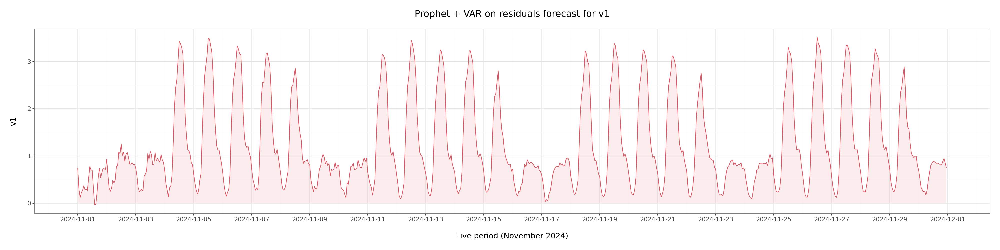

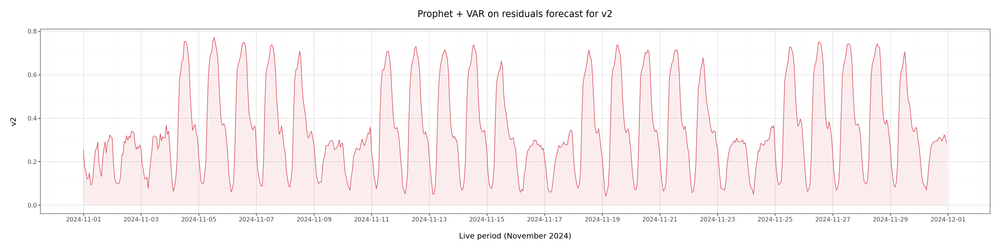

In [153]:
display(
    ggplot(var_live_predictions, aes(x='ts', y='v1'))
    + geom_line(color=color[0], size=0.5)
    + geom_area(fill = color[0], alpha=0.1)
    + theme_bw()
    + scale_x_datetime(date_breaks='2 days', date_labels='%Y-%m-%d')
    + theme(figure_size=(20, 5))
    + labs(x = 'Live period (November 2024)', y = 'v1', title = 'Prophet + VAR on residuals forecast for v1')
)

display(
    ggplot(var_live_predictions, aes(x='ts', y='v2'))
    + geom_line(color=color[0], size=0.5)
    + geom_area(fill = color[0], alpha=0.1)
    + theme_bw()
    + scale_x_datetime(date_breaks='2 days', date_labels='%Y-%m-%d')
    + theme(figure_size=(20, 5))
    + labs(x = 'Live period (November 2024)', y = 'v2', title = 'Prophet + VAR on residuals forecast for v2')
)

Finally, I save the results in the required format.

In [152]:
var_live_predictions.to_csv('forecast_Marton_Nagy.csv', index=True)